<a href="https://colab.research.google.com/github/nivi-nivedita/TCS-iON/blob/main/Nivedita_TCS10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install keras_tqdm 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import numpy as np
import cv2
import os
import pandas as pd
import string
import matplotlib.pyplot as plt

import os
from google.colab import drive #To use googel drive to get files.

from keras.preprocessing.sequence import pad_sequences

from keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional
from keras.models import Model
from keras.activations import relu, sigmoid, softmax
import keras.backend as K
from tensorflow.keras.utils import to_categorical
from keras.callbacks import ModelCheckpoint
from keras_tqdm import TQDMNotebookCallback

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [3]:
import tensorflow as tf

#ignore warnings in the output
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [4]:
from tensorflow.python.client import device_lib

# Check all available devices if GPU is available
print(device_lib.list_local_devices())
sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 5800469564105225542
xla_global_id: -1
]
Device mapping: no known devices.


In [5]:
tf.config.experimental.list_physical_devices('GPU')

[]

In [6]:
tf.test.gpu_device_name()

''

In [7]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [8]:
with open('/content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Data/words.txt') as f:
    contents = f.readlines()

lines = [line.strip() for line in contents] 
lines[0]

'a01-000u-00-00 ok 154 408 768 27 51 AT A'

In [9]:
max_label_len = 0

char_list = "!\"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz" 

# string.ascii_letters + string.digits (Chars & Digits)
# or 
# "!\"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"

print(char_list, len(char_list))

def encode_to_labels(txt):
    # encoding each output word into digits
    dig_lst = []
    for index, chara in enumerate(txt):
        dig_lst.append(char_list.index(chara))
        
    return dig_lst

!"#&'()*+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz 78


In [10]:
images = []
labels = []

RECORDS_COUNT = 10000

In [11]:
train_images = []
train_labels = []
train_input_length = []
train_label_length = []
train_original_text = []

valid_images = []
valid_labels = []
valid_input_length = []
valid_label_length = []
valid_original_text = []

inputs_length = []
labels_length = []

In [12]:
def process_image(img):
    """
    Converts image to shape (32, 128, 1) & normalize
    """
    w, h = img.shape
    
#     _, img = cv2.threshold(img, 
#                            128, 
#                            255, 
#                            cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    
    # Aspect Ratio Calculation
    new_w = 32
    new_h = int(h * (new_w / w))
    img = cv2.resize(img, (new_h, new_w))
    w, h = img.shape
    
    img = img.astype('float32')
    
    # Converts each to (32, 128, 1)
    if w < 32:
        add_zeros = np.full((32-w, h), 255)
        img = np.concatenate((img, add_zeros))
        w, h = img.shape
    
    if h < 128:
        add_zeros = np.full((w, 128-h), 255)
        img = np.concatenate((img, add_zeros), axis=1)
        w, h = img.shape
        
    if h > 128 or w > 32:
        dim = (128,32)
        img = cv2.resize(img, dim)
    
    img = cv2.subtract(255, img)
    
    img = np.expand_dims(img, axis=2)
    
    # Normalize 
    img = img / 255
    
    return img

In [13]:
for index, line in enumerate(lines):
    splits = line.split(' ')
    status = splits[1]
    
    if status == 'ok':
        word_id = splits[0]
        word = "".join(splits[8:])
        
        splits_id = word_id.split('-')
        filepath = '/content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/words/{}/{}-{}/{}.png'.format(splits_id[0], 
                                                  splits_id[0], 
                                                  splits_id[1], 
                                                  word_id)
        
        # processing on image
        img = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)
        try:
            img = process_image(img)
        except:
            continue
            
        # processing on label
        try:
            label = encode_to_labels(word)
        except:
            continue
        
        if index % 10 == 0:
            valid_images.append(img)
            valid_labels.append(label)
            valid_input_length.append(31)
            valid_label_length.append(len(word))
            valid_original_text.append(word)
        else:
            train_images.append(img)
            train_labels.append(label)
            train_input_length.append(31)
            train_label_length.append(len(word))
            train_original_text.append(word)
        
        if len(word) > max_label_len:
            max_label_len = len(word)
    
    if index >= RECORDS_COUNT:
        break

In [14]:
train_padded_label = pad_sequences(train_labels, 
                             maxlen=max_label_len, 
                             padding='post',
                             value=len(char_list))

valid_padded_label = pad_sequences(valid_labels, 
                             maxlen=max_label_len, 
                             padding='post',
                             value=len(char_list))

In [15]:
train_padded_label.shape, valid_padded_label.shape

((7850, 16), (876, 16))

In [16]:
train_images = np.asarray(train_images)
train_input_length = np.asarray(train_input_length)
train_label_length = np.asarray(train_label_length)

valid_images = np.asarray(valid_images)
valid_input_length = np.asarray(valid_input_length)
valid_label_length = np.asarray(valid_label_length)

In [17]:
train_images.shape

(7850, 32, 128, 1)

In [18]:
inputs = Input(shape=(32,128,1))
 
# convolution layer with kernel size (3,3)
conv_1 = Conv2D(64, (3,3), activation = 'relu', padding='same')(inputs)
# poolig layer with kernel size (2,2)
pool_1 = MaxPool2D(pool_size=(2, 2), strides=2)(conv_1)
 
conv_2 = Conv2D(128, (3,3), activation = 'relu', padding='same')(pool_1)
pool_2 = MaxPool2D(pool_size=(2, 2), strides=2)(conv_2)
 
conv_3 = Conv2D(256, (3,3), activation = 'relu', padding='same')(pool_2)
 
conv_4 = Conv2D(256, (3,3), activation = 'relu', padding='same')(conv_3)

# poolig layer with kernel size (2,1)
pool_4 = MaxPool2D(pool_size=(2, 1))(conv_4)
 
conv_5 = Conv2D(512, (3,3), activation = 'relu', padding='same')(pool_4)

# Batch normalization layer
batch_norm_5 = BatchNormalization()(conv_5)
 
conv_6 = Conv2D(512, (3,3), activation = 'relu', padding='same')(batch_norm_5)
batch_norm_6 = BatchNormalization()(conv_6)
pool_6 = MaxPool2D(pool_size=(2, 1))(batch_norm_6)
 
conv_7 = Conv2D(512, (2,2), activation = 'relu')(pool_6)
 
squeezed = Lambda(lambda x: K.squeeze(x, 1))(conv_7)
 
# bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(256, return_sequences=True, dropout = 0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(256, return_sequences=True, dropout = 0.2))(blstm_1)
 
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time
act_model = Model(inputs, outputs)

In [19]:
act_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 128, 1)]      0         
                                                                 
 conv2d (Conv2D)             (None, 32, 128, 64)       640       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 64, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 64, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 32, 128)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 32, 256)        295168

In [20]:

the_labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, the_labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, the_labels, input_length, label_length], outputs=loss_out)

In [21]:
batch_size = 8
epochs = 15
e = str(epochs)
optimizer_name = 'sgd'

In [22]:
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = optimizer_name, metrics=['accuracy'],run_eagerly=True)

filepath="/content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Model/{}o-{}r-{}e-{}t-{}v.hdf5".format(optimizer_name,
                                          str(RECORDS_COUNT),
                                          str(epochs),
                                          str(train_images.shape[0]),
                                          str(valid_images.shape[0]))

checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto')
callbacks_list = [checkpoint]

In [23]:



history = model.fit(x=[train_images, train_padded_label, train_input_length, train_label_length],
                    y=np.zeros(len(train_images)),
                    batch_size=batch_size, 
                    epochs=epochs, 
                    validation_data=([valid_images, valid_padded_label, valid_input_length, valid_label_length], [np.zeros(len(valid_images))]),
                    verbose=2,
                    callbacks=callbacks_list)

Epoch 1/15

Epoch 1: val_loss improved from inf to 16.14149, saving model to /content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Model/sgdo-10000r-15e-7850t-876v.hdf5
982/982 - 2135s - loss: 15.4477 - accuracy: 0.0000e+00 - val_loss: 16.1415 - val_accuracy: 0.0000e+00 - 2135s/epoch - 2s/step
Epoch 2/15

Epoch 2: val_loss improved from 16.14149 to 12.13766, saving model to /content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Model/sgdo-10000r-15e-7850t-876v.hdf5
982/982 - 2108s - loss: 12.8093 - accuracy: 0.0172 - val_loss: 12.1377 - val_accuracy: 0.0559 - 2108s/epoch - 2s/step
Epoch 3/15

Epoch 3: val_loss improved from 12.13766 to 11.29758, saving model to /content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Model/sgdo-10000r-15e-7850t-876v.hdf5
982/982 - 2104s - loss: 10.9447 - accuracy: 0.0580 - val_loss: 11.2976 - val_accuracy: 0.0639 - 2104s/epoch - 2s/step
Epoch 4/15

Epoch 4: val_loss did not improve from 11.29758
982/982 - 2086s 

In [24]:
!pip install python-levenshtein

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 50 kB 5.2 MB/s 
  Created wheel for python-levenshtein: filename=python_Levenshtein-0.12.2-cp37-cp37m-linux_x86_64.whl size=149876 sha256=477991f543b4a65f2a78076842ee82986840433a43f3e598a4e8c3d606146296
  Stored in directory: /root/.cache/pip/wheels/05/5f/ca/7c4367734892581bb5ff896f15027a932c551080b2abd3e00d
Successfully built python-levenshtein


In [25]:
# load the saved best model weights
act_model.load_weights(filepath)

# predict outputs on validation images
prediction = act_model.predict(valid_images)
 
# use CTC decoder
decoded = K.ctc_decode(prediction, 
                       input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                       greedy=True)[0][0]
out = K.get_value(decoded)

import Levenshtein as lv

total_jaro = 0
total_rati = 0
# see the results
for i, x in enumerate(out):
    letters=''
    for p in x:
        if int(p) != -1:
            letters+=char_list[int(p)]
    total_jaro+=lv.jaro(letters, valid_original_text[i])
    total_rati+=lv.ratio(letters, valid_original_text[i])

print('jaro :', total_jaro/len(out))
print('ratio:', total_rati/len(out))

jaro : 0.8998226157615435
ratio: 0.8617545531081181


original_text =   Labour
predicted text = Labour

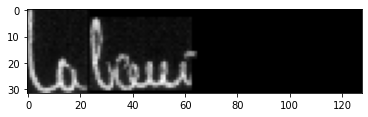



original_text =   0MPs
predicted text = oPs

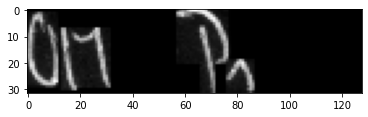



original_text =   tomorrow
predicted text = tomanrow

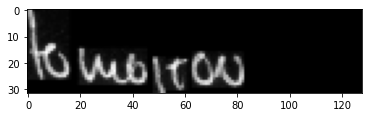



original_text =   .
predicted text = .

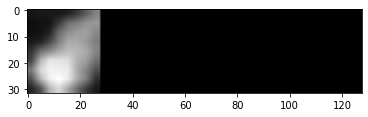



original_text =   Mr.
predicted text = Mr.

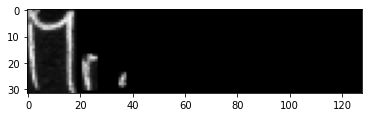



original_text =   Michael
predicted text = Michael

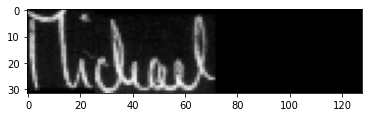



original_text =   Foot
predicted text = Foot

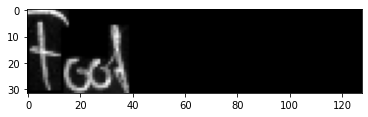



original_text =   put
predicted text = pet

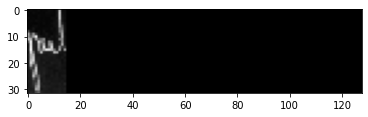



original_text =   down
predicted text = dom

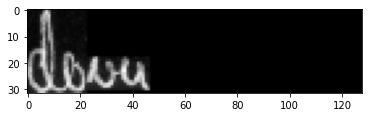



original_text =   a
predicted text = a

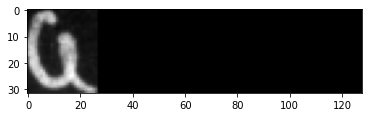



original_text =   resolution
predicted text = resolution

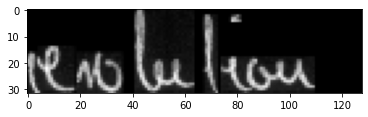



original_text =   on
predicted text = on

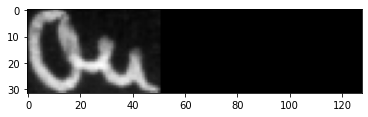



original_text =   the
predicted text = the

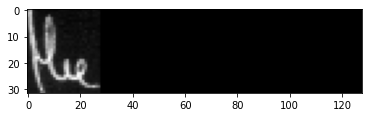



original_text =   subject
predicted text = sljet

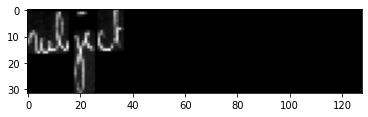



original_text =   and
predicted text = and

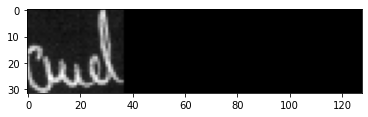



original_text =   he
predicted text = he

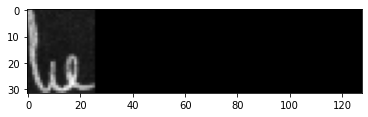



original_text =   to
predicted text = to

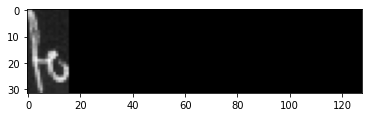



original_text =   be
predicted text = be

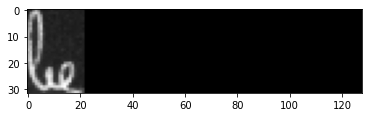



original_text =   backed
predicted text = backed

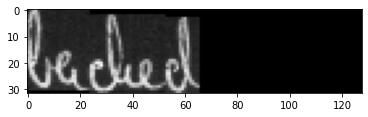



original_text =   by
predicted text = by

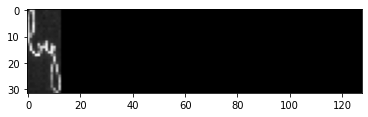



original_text =   Mr.
predicted text = Mr.

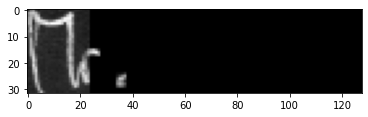



original_text =   Will
predicted text = Will

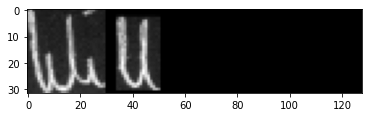



original_text =   Griffiths
predicted text = Giffths

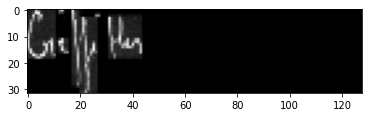



original_text =   ,
predicted text = ,

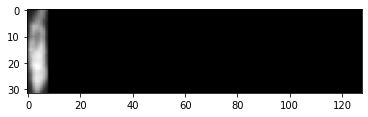



original_text =   0MP
predicted text = MMMP

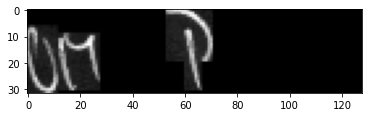



original_text =   Manchester
predicted text = Manchester

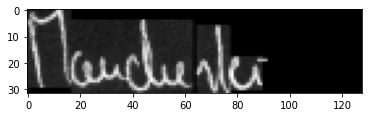



original_text =   Exchange
predicted text = Brcdonge

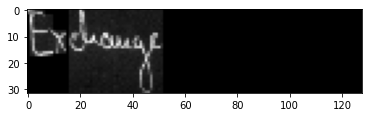



original_text =   .
predicted text = .

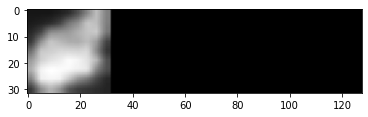



original_text =   Though
predicted text = Thoghe

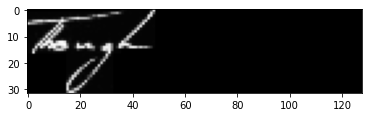



original_text =   they
predicted text = they

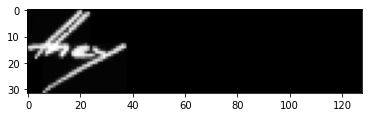



original_text =   may
predicted text = may

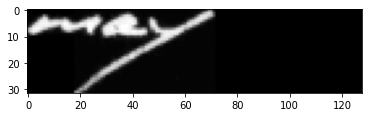



original_text =   gather
predicted text = gather

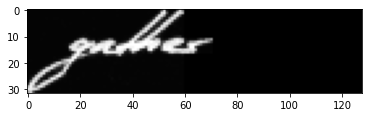



original_text =   some
predicted text = some

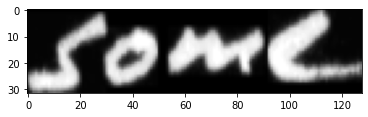



original_text =   Left-wing
predicted text = lef-wng

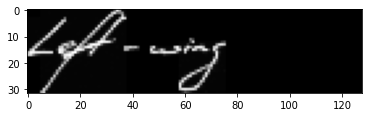



original_text =   ,
predicted text = ,

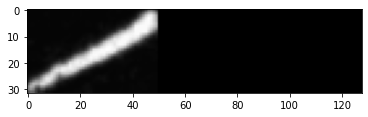



original_text =   a
predicted text = a

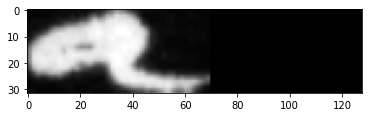



original_text =   large
predicted text = lange

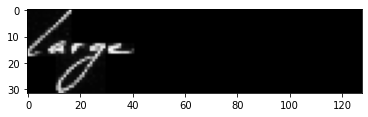



original_text =   majority
predicted text = majoity

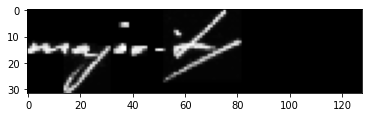



original_text =   of
predicted text = of

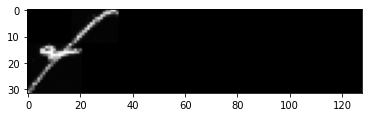



original_text =   Labour
predicted text = Labour

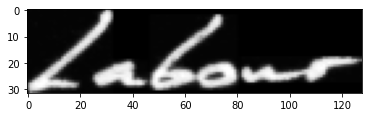



original_text =   MPs
predicted text = MPs

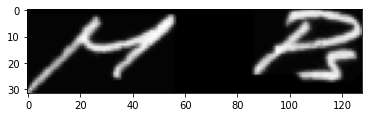



original_text =   are
predicted text = are

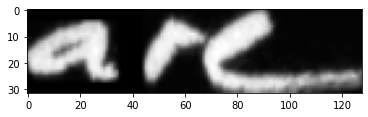



original_text =   likely
predicted text = likealy

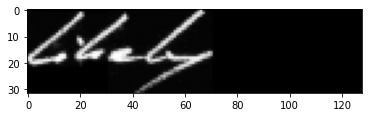



original_text =   turn
predicted text = turn

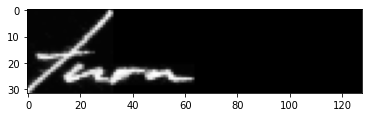



original_text =   down
predicted text = down

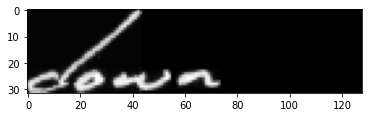



original_text =   the
predicted text = the

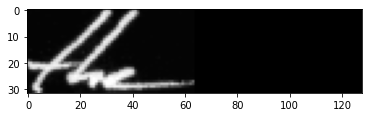



original_text =   Foot-Griffiths
predicted text = Foodt-cifiths

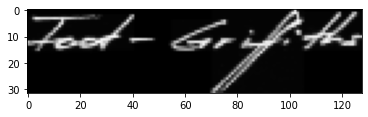



original_text =   resolution
predicted text = resolktion

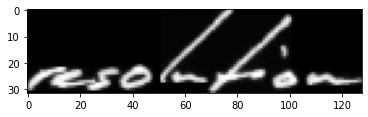



original_text =   .
predicted text = .

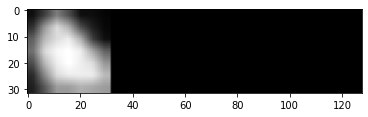



original_text =   Mr.
predicted text = Mr.

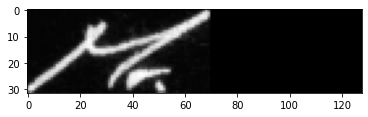



original_text =   Foot's
predicted text = Foot's

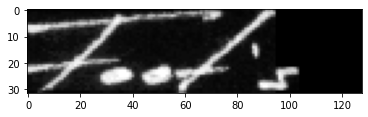



original_text =   line
predicted text = line

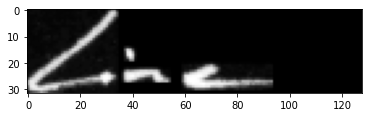



original_text =   be
predicted text = be

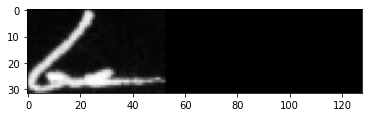



original_text =   that
predicted text = that

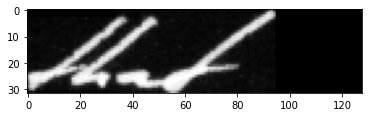



original_text =   as
predicted text = as

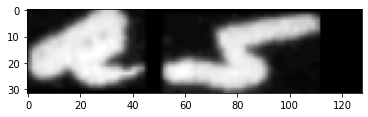



original_text =   Labour
predicted text = Labour

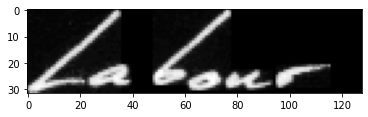



original_text =   MPs
predicted text = MPs

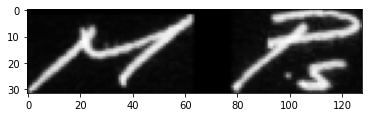



original_text =   opposed
predicted text = oppased

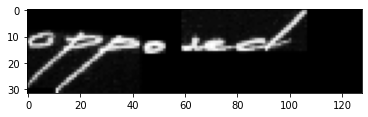



original_text =   the
predicted text = the

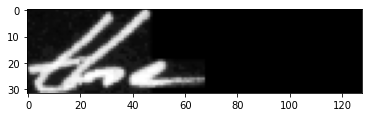



original_text =   Government
predicted text = Governnent

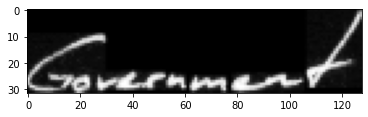



original_text =   Bill
predicted text = Bil

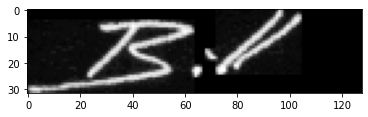



original_text =   brought
predicted text = hrought

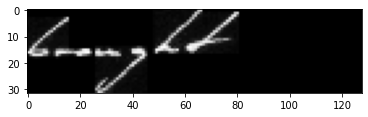



original_text =   life
predicted text = life

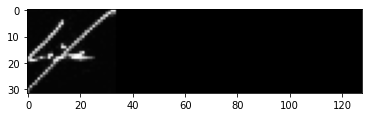



original_text =   peers
predicted text = peers

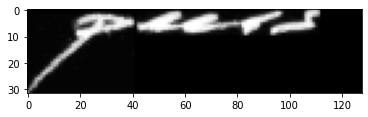



original_text =   into
predicted text = into

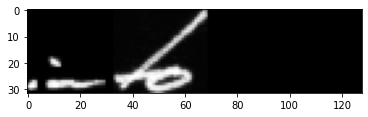



original_text =   existence
predicted text = axistance

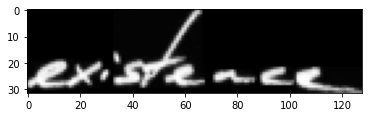



original_text =   ,
predicted text = ,

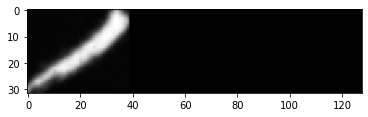



original_text =   they
predicted text = they

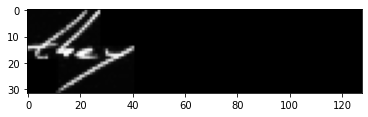



original_text =   should
predicted text = should

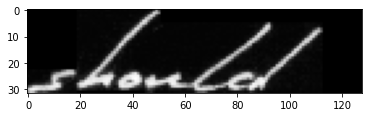



original_text =   not
predicted text = not

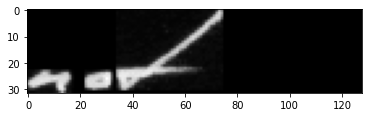



original_text =   put
predicted text = put

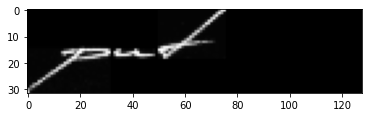



original_text =   forward
predicted text = foraend

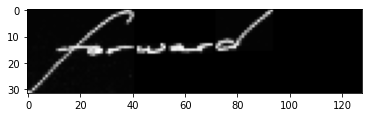



original_text =   nominees
predicted text = nominees

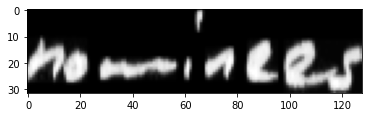



original_text =   .
predicted text = .

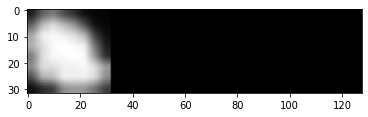



original_text =   He
predicted text = He

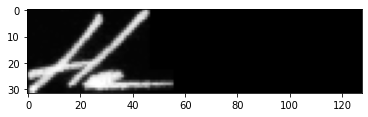



original_text =   believes
predicted text = Lalievs

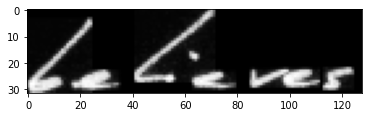



original_text =   that
predicted text = that

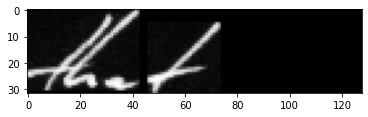



original_text =   the
predicted text = the

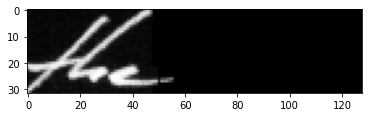



original_text =   House
predicted text = Homse

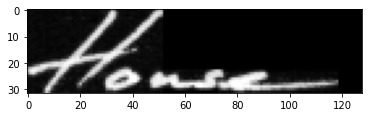



original_text =   Lords
predicted text = Lords

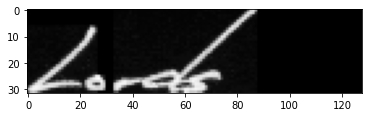



original_text =   should
predicted text = should

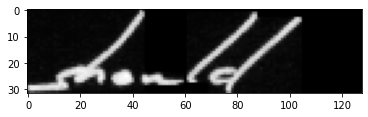



original_text =   be
predicted text = be

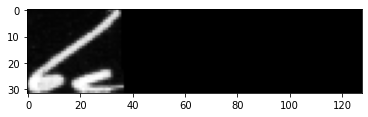



original_text =   abolished
predicted text = abolished

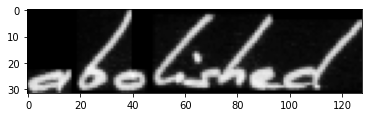



original_text =   and
predicted text = and

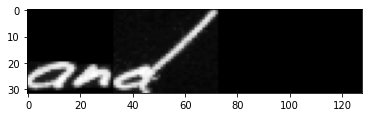



original_text =   that
predicted text = that

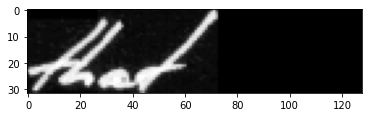



original_text =   Labour
predicted text = Labour

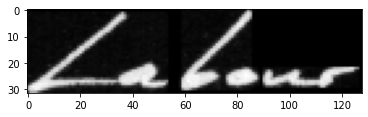



original_text =   should
predicted text = should

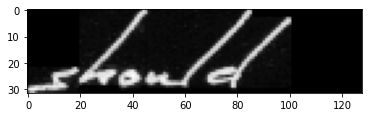



original_text =   not
predicted text = not

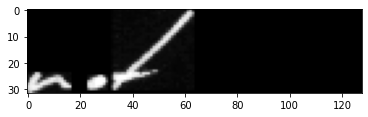



original_text =   any
predicted text = any

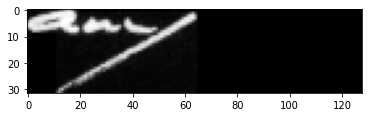



original_text =   steps
predicted text = sdeps

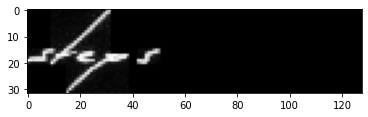



original_text =   institution
predicted text = institution

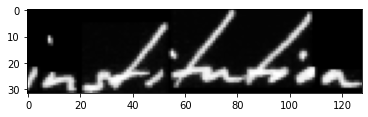



original_text =   .
predicted text = .

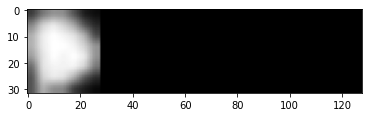



original_text =   Though
predicted text = Though

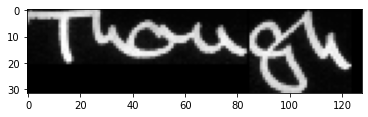



original_text =   they
predicted text = they

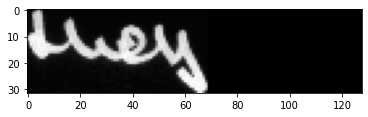



original_text =   may
predicted text = may

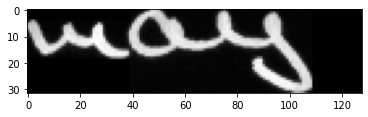



original_text =   gather
predicted text = gather

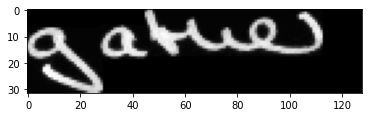



original_text =   some
predicted text = some

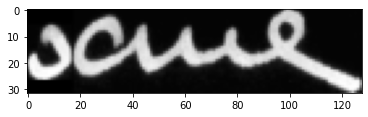



original_text =   support
predicted text = suppont

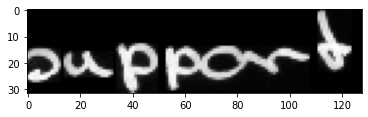



original_text =   ,
predicted text = ,

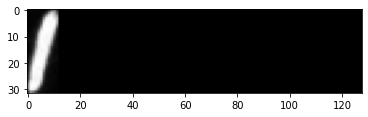



original_text =   a
predicted text = a

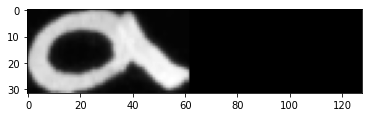



original_text =   large
predicted text = large

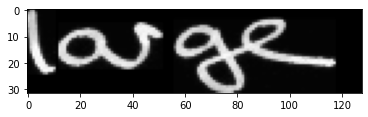



original_text =   majority
predicted text = majovity

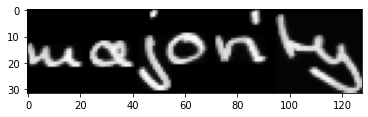



original_text =   of
predicted text = af

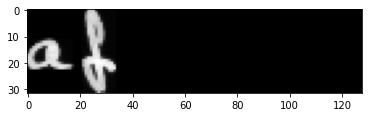



original_text =   Labour
predicted text = Labour

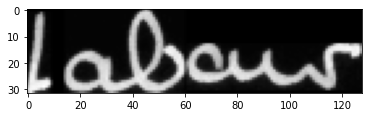



original_text =   MPs
predicted text = MPs

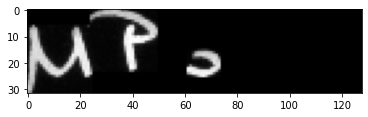



original_text =   are
predicted text = are

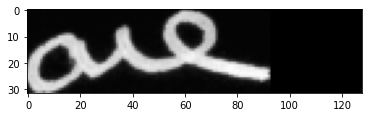



original_text =   to
predicted text = to

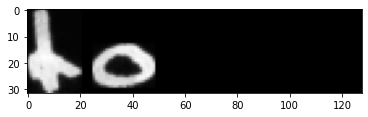



original_text =   turn
predicted text = turn

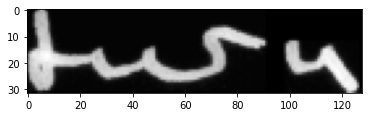



original_text =   down
predicted text = down

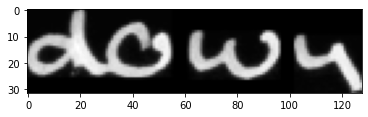



original_text =   the
predicted text = the

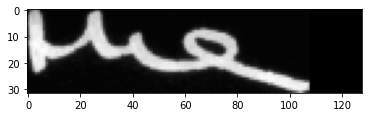



original_text =   Foot-
predicted text = Foot-

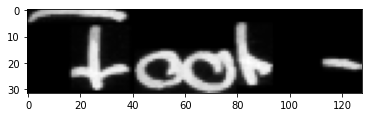



original_text =   be
predicted text = be

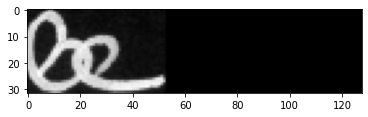



original_text =   that
predicted text = that

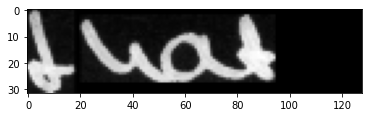



original_text =   as
predicted text = as

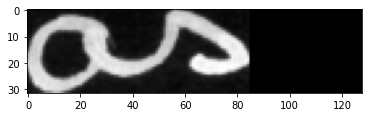



original_text =   Labour
predicted text = Labour

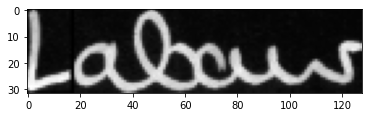



original_text =   MPs
predicted text = MPs

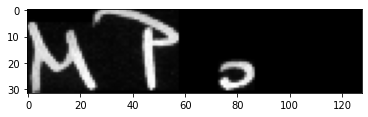



original_text =   opposed
predicted text = opposed

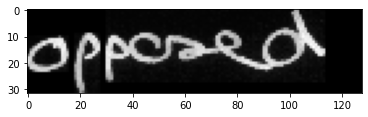



original_text =   the
predicted text = the

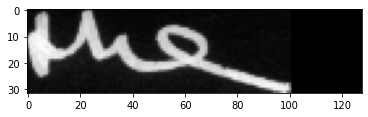



original_text =   Bill
predicted text = Bill

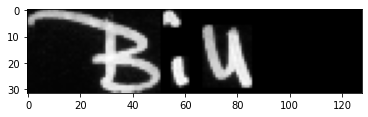



original_text =   which
predicted text = whicn

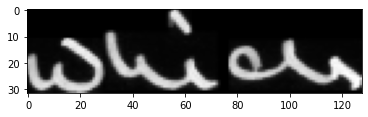



original_text =   brought
predicted text = brought

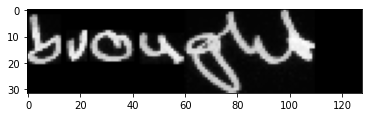



original_text =   life
predicted text = life

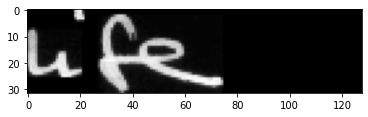



original_text =   peers
predicted text = peers

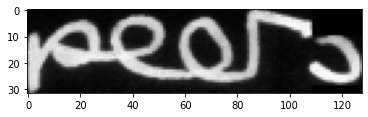



original_text =   into
predicted text = into

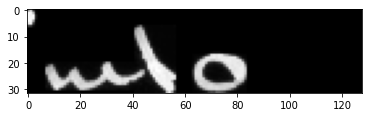



original_text =   existence
predicted text = existence

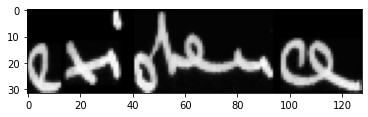



original_text =   ,
predicted text = ,

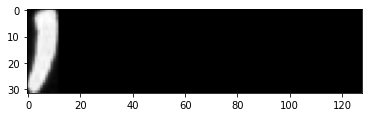



original_text =   they
predicted text = they

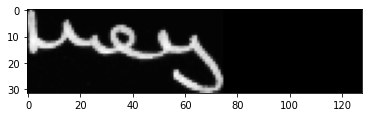



original_text =   not
predicted text = not

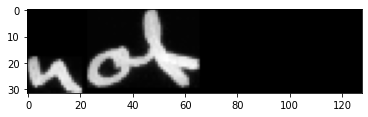



original_text =   now
predicted text = now

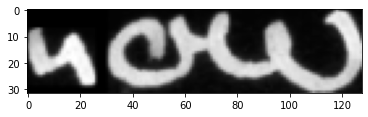



original_text =   put
predicted text = put

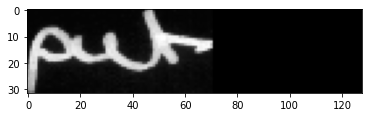



original_text =   forward
predicted text = forward

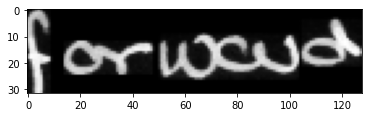



original_text =   nominees
predicted text = wominees

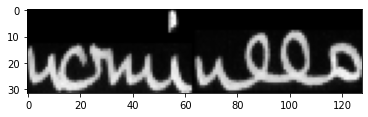



original_text =   .
predicted text = .

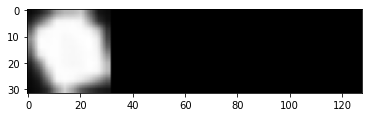



original_text =   He
predicted text = He

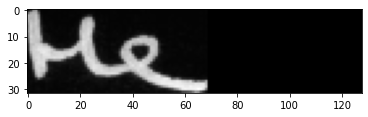



original_text =   believes
predicted text = believes

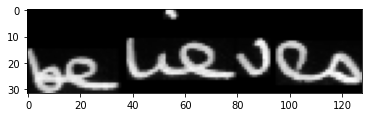



original_text =   that
predicted text = that

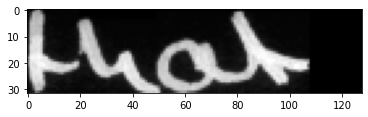



original_text =   House
predicted text = House

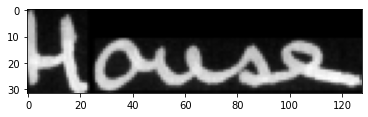



original_text =   of
predicted text = of

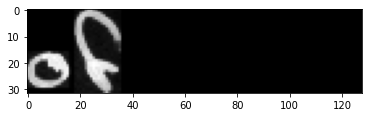



original_text =   Lords
predicted text = Lors

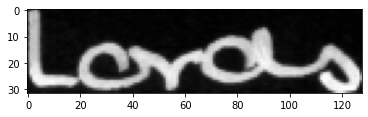



original_text =   should
predicted text = should

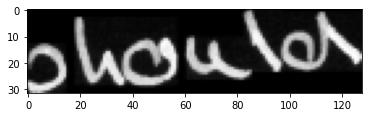



original_text =   be
predicted text = be

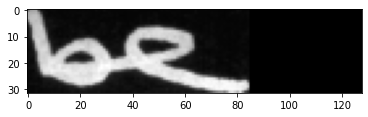



original_text =   abolished
predicted text = abolished

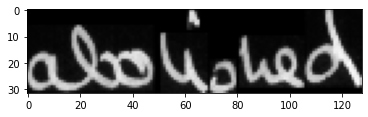



original_text =   and
predicted text = and

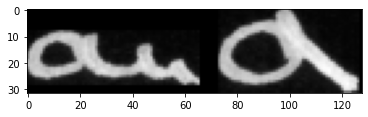



original_text =   that
predicted text = that

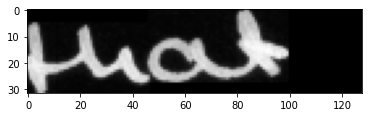



original_text =   Labour
predicted text = Labour

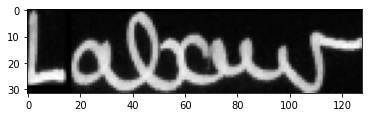



original_text =   not
predicted text = not

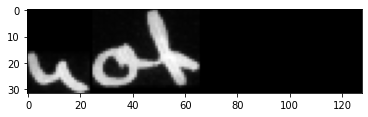



original_text =   take
predicted text = take

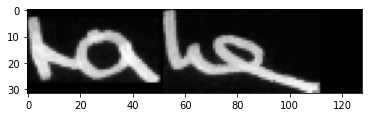



original_text =   any
predicted text = an

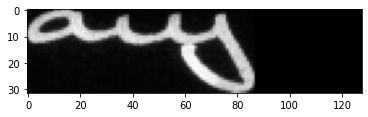



original_text =   steps
predicted text = steps

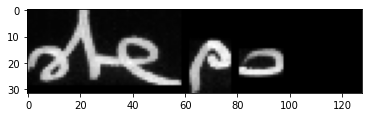



original_text =   which
predicted text = which

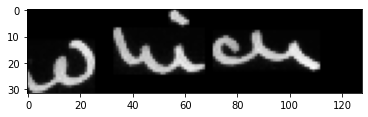



original_text =   would
predicted text = would

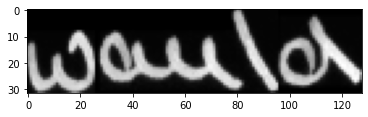



original_text =   appear
predicted text = appear

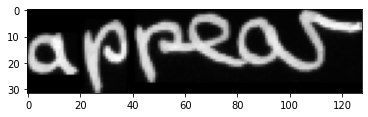



original_text =   to
predicted text = to

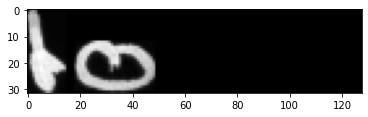



original_text =   "
predicted text = "

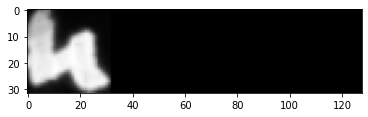



original_text =   up
predicted text = up

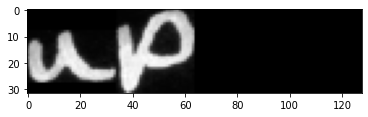



original_text =   "
predicted text = "

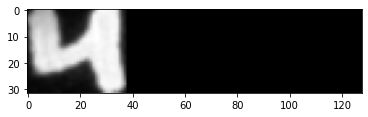



original_text =   an
predicted text = an

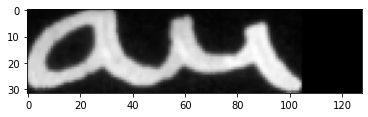



original_text =   out-
predicted text = out-

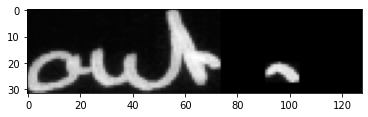



original_text =   large
predicted text = lange

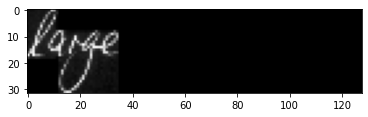



original_text =   majority
predicted text = mgiornty

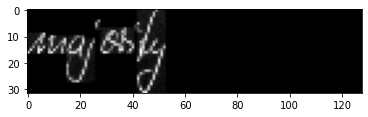



original_text =   of
predicted text = of

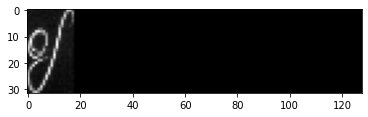



original_text =   Labour
predicted text = Labour

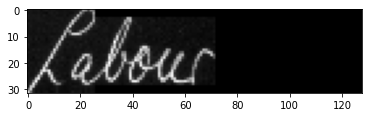



original_text =   0MPs
predicted text = MMPs

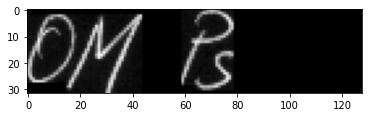



original_text =   are
predicted text = are

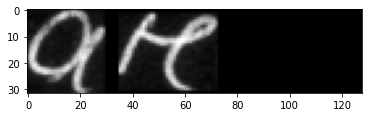



original_text =   to
predicted text = to

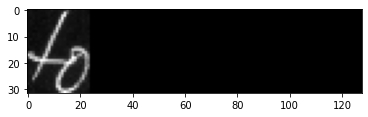



original_text =   turn
predicted text = turn

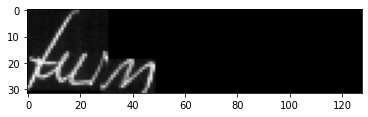



original_text =   Bill
predicted text = Bill

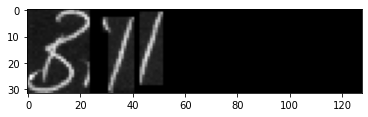



original_text =   which
predicted text = which

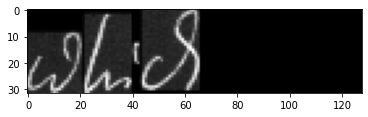



original_text =   brought
predicted text = brought

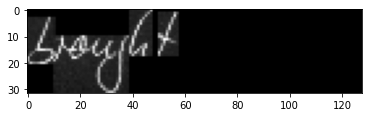



original_text =   life
predicted text = life

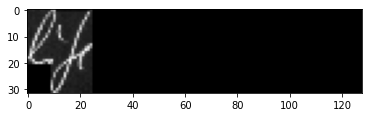



original_text =   peers
predicted text = peers

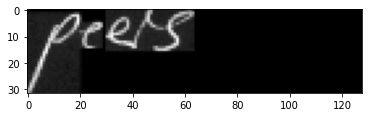



original_text =   into
predicted text = into

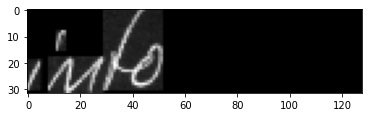



original_text =   existence
predicted text = existence

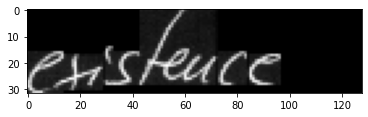



original_text =   ,
predicted text = ,

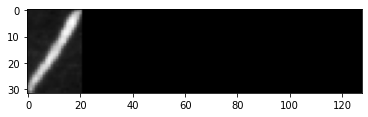



original_text =   they
predicted text = they

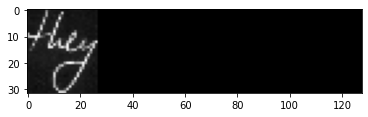



original_text =   not
predicted text = not

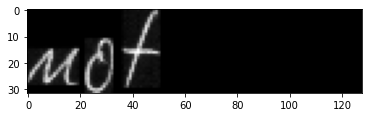



original_text =   now
predicted text = now

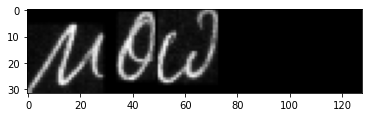



original_text =   put
predicted text = put

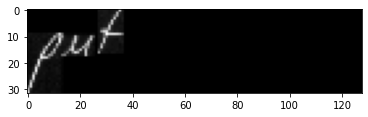



original_text =   forward
predicted text = forwad

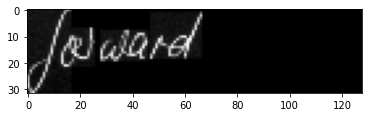



original_text =   nominees
predicted text = nominees

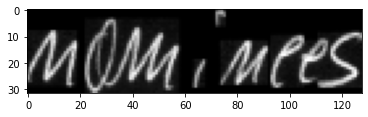



original_text =   .
predicted text = .

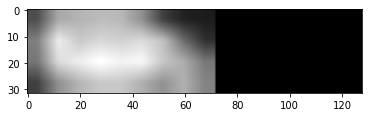



original_text =   He
predicted text = He

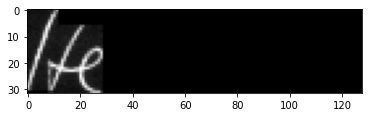



original_text =   believes
predicted text = bedieves

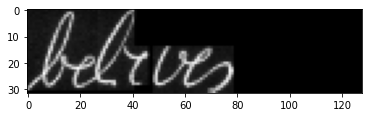



original_text =   that
predicted text = that

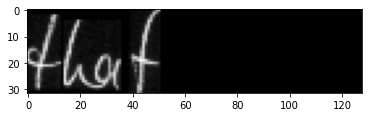



original_text =   House
predicted text = House

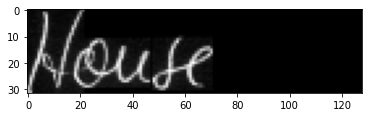



original_text =   of
predicted text = of

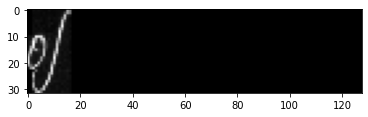



original_text =   Lords
predicted text = Lords

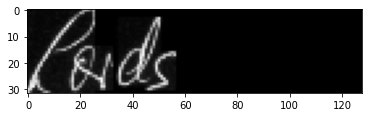



original_text =   should
predicted text = should

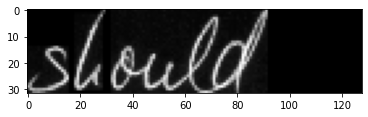



original_text =   be
predicted text = be

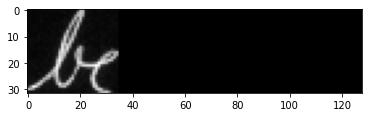



original_text =   abolished
predicted text = abolished

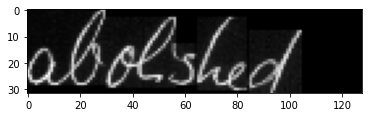



original_text =   and
predicted text = and

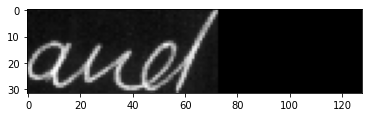



original_text =   that
predicted text = that

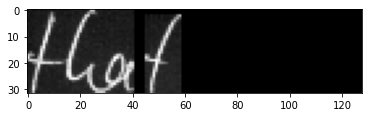



original_text =   Labour
predicted text = Labour

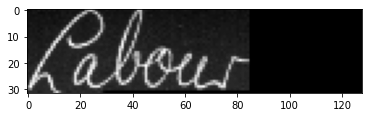



original_text =   not
predicted text = not

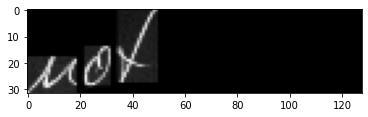



original_text =   take
predicted text = take

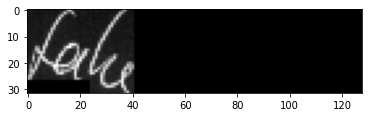



original_text =   any
predicted text = any

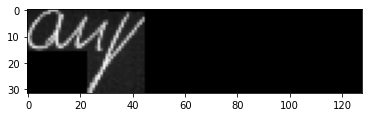



original_text =   steps
predicted text = steps

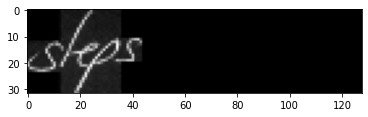



original_text =   which
predicted text = which

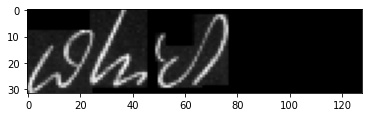



original_text =   would
predicted text = would

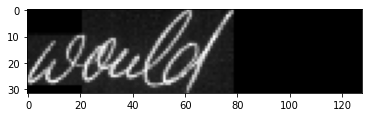



original_text =   appear
predicted text = appea

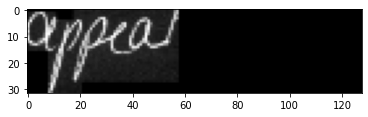



original_text =   to
predicted text = to

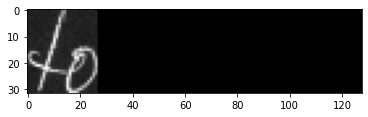



original_text =   "
predicted text = "

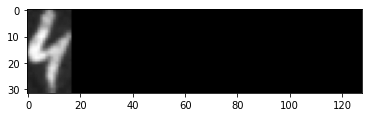



original_text =   up
predicted text = up

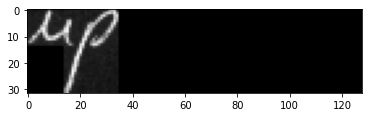



original_text =   "
predicted text = "

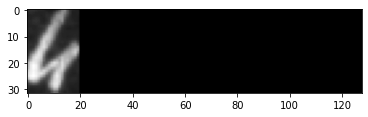



original_text =   an
predicted text = an

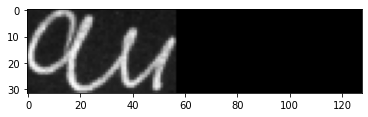



original_text =   out-dated
predicted text = out-dated

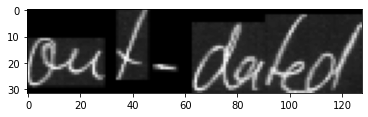



original_text =   institution
predicted text = institution

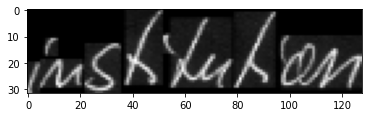



original_text =   .
predicted text = .

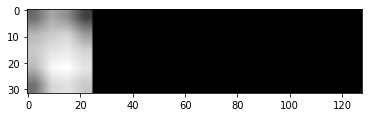



original_text =   Since
predicted text = Since

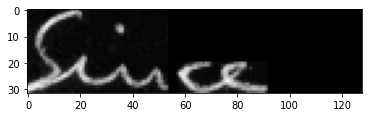



original_text =   1958
predicted text = 1958

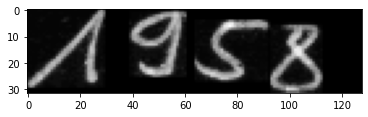



original_text =   ,
predicted text = ,

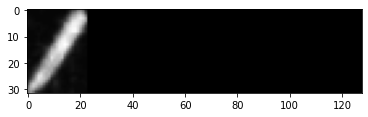



original_text =   Labour
predicted text = Labou

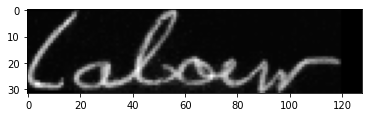



original_text =   life
predicted text = life

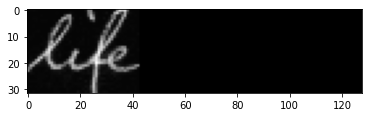



original_text =   Peers
predicted text = Peers

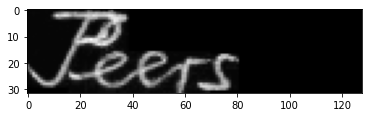



original_text =   and
predicted text = and

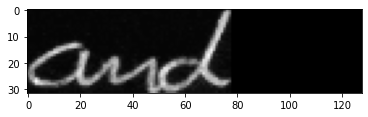



original_text =   Peeresses
predicted text = Peresses

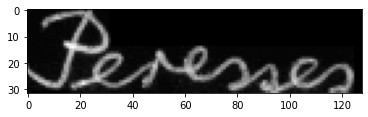



original_text =   have
predicted text = have

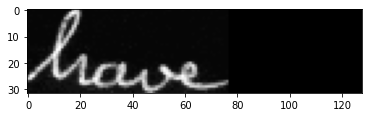



original_text =   been
predicted text = been

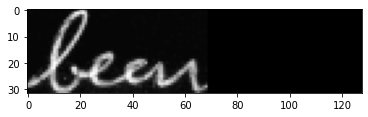



original_text =   created
predicted text = created

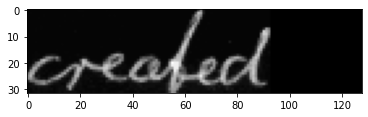



original_text =   .
predicted text = .

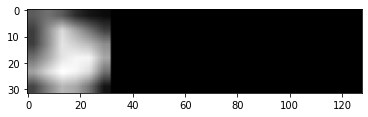



original_text =   Labour
predicted text = Labour

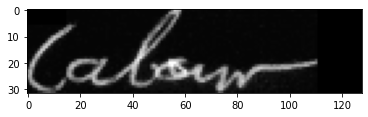



original_text =   sentiment
predicted text = sentiment

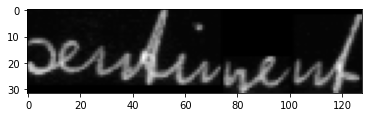



original_text =   would
predicted text = would

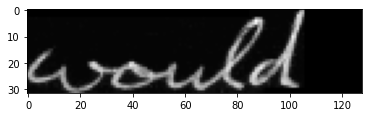



original_text =   #
predicted text = s

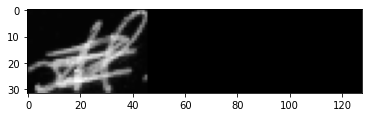



original_text =   still
predicted text = still

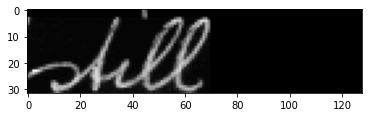



original_text =   favour
predicted text = favour

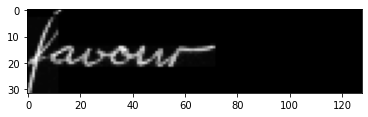



original_text =   the
predicted text = the

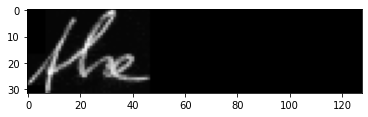



original_text =   abolition
predicted text = abolition

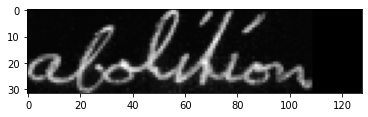



original_text =   of
predicted text = of

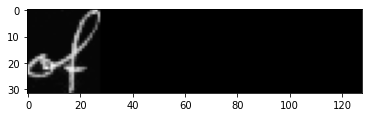



original_text =   House
predicted text = House

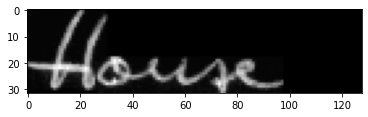



original_text =   of
predicted text = of

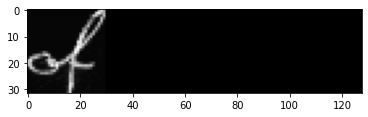



original_text =   Lords
predicted text = Lords

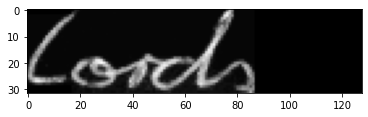



original_text =   ,
predicted text = ,

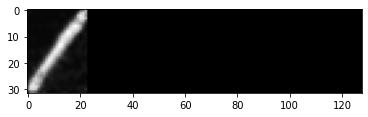



original_text =   but
predicted text = but

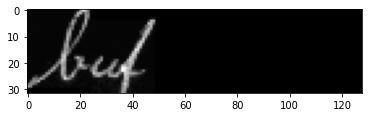



original_text =   while
predicted text = while

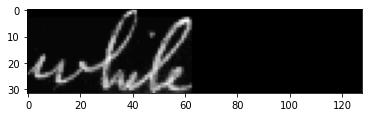



original_text =   it
predicted text = it

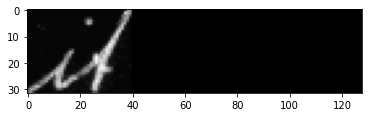



original_text =   remains
predicted text = remains

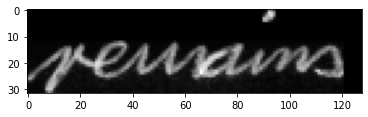



original_text =   Labour
predicted text = Labour

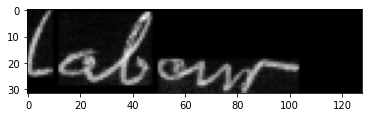



original_text =   to
predicted text = to

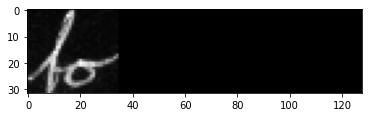



original_text =   have
predicted text = have

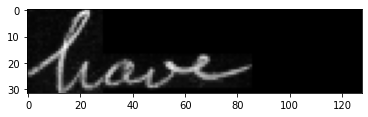



original_text =   an
predicted text = an

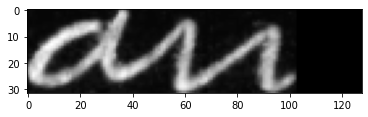



original_text =   adequate
predicted text = adequnate

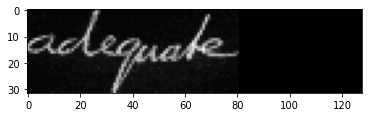



original_text =   number
predicted text = number

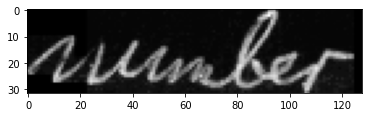



original_text =   of
predicted text = of

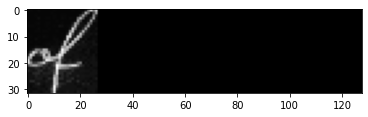



original_text =   members
predicted text = membens

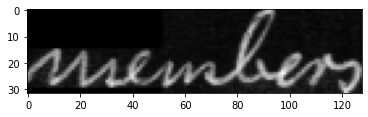



original_text =   .
predicted text = .

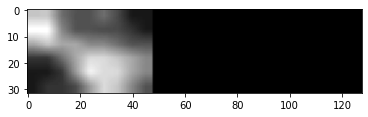



original_text =   THE
predicted text = TE

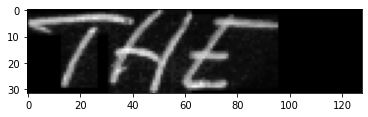



original_text =   rival
predicted text = rival

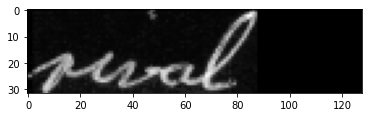



original_text =   African
predicted text = Afrmican

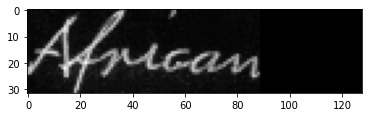



original_text =   Nationalist
predicted text = Mationalist

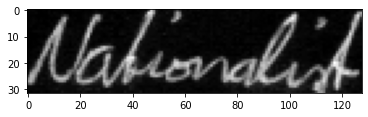



original_text =   Parties
predicted text = Parties

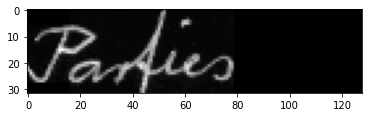



original_text =   of
predicted text = of

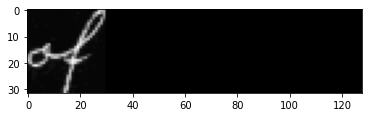



original_text =   Northern
predicted text = Northenn

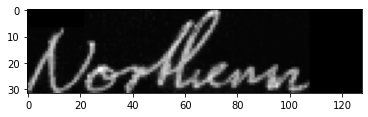



original_text =   Rhodesia
predicted text = Rhodesia

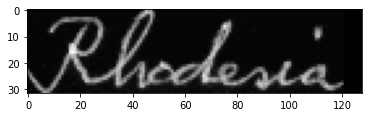



original_text =   have
predicted text = have

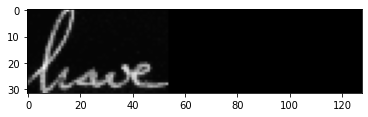



original_text =   agreed
predicted text = agned

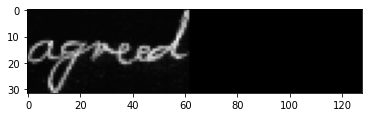



original_text =   get
predicted text = get

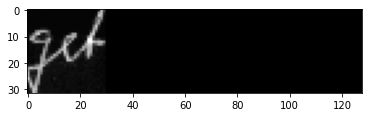



original_text =   together
predicted text = together

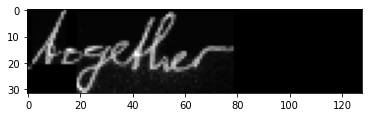



original_text =   to
predicted text = to

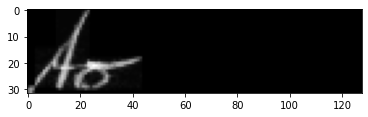



original_text =   face
predicted text = face

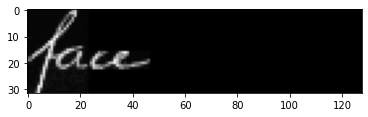



original_text =   the
predicted text = the

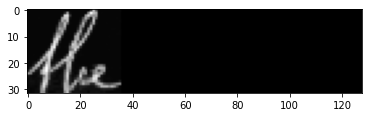



original_text =   challenge
predicted text = challenge

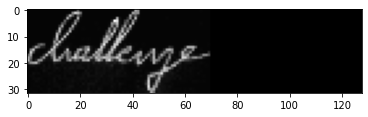



original_text =   from
predicted text = from

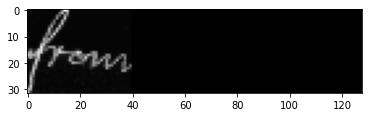



original_text =   Sir
predicted text = Sir

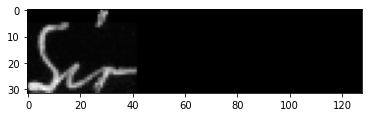



original_text =   Roy
predicted text = Roy

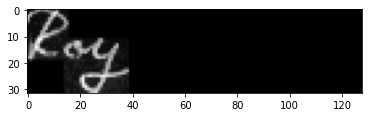



original_text =   ,
predicted text = ,

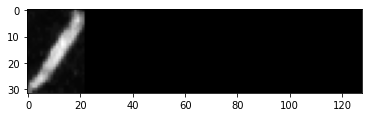



original_text =   the
predicted text = the

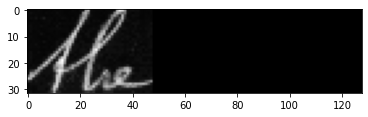



original_text =   Federal
predicted text = Federl

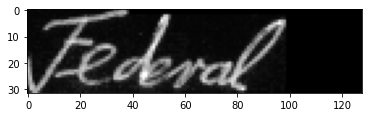



original_text =   Premier
predicted text = Premier

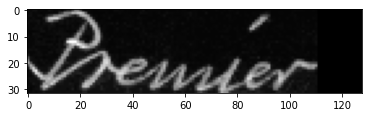



original_text =   .
predicted text = .

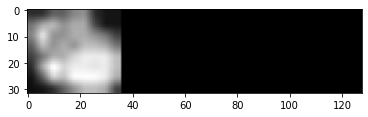



original_text =   Since
predicted text = Since

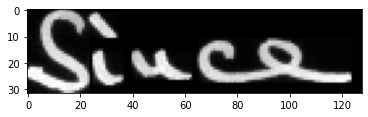



original_text =   1958
predicted text = 1958

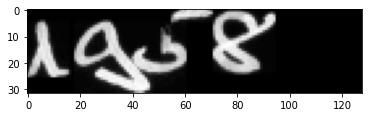



original_text =   ,
predicted text = ,

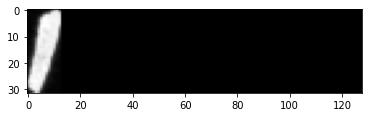



original_text =   13
predicted text = 13

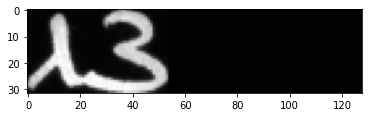



original_text =   life
predicted text = life

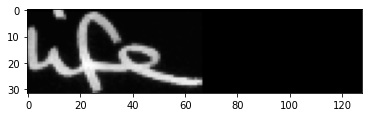



original_text =   Peers
predicted text = Peers

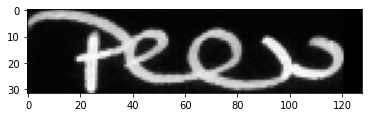



original_text =   and
predicted text = and

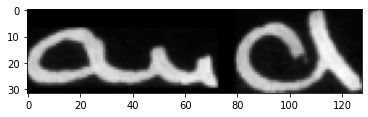



original_text =   Peeresses
predicted text = Peeresses

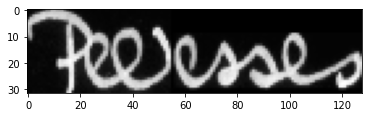



original_text =   have
predicted text = have

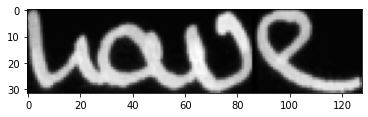



original_text =   been
predicted text = been

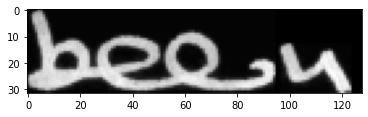



original_text =   created
predicted text = created

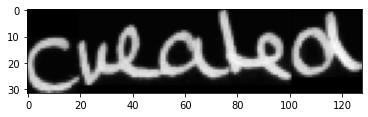



original_text =   .
predicted text = .

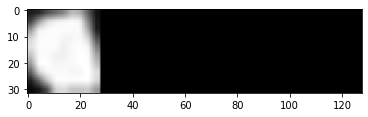



original_text =   Most
predicted text = Most

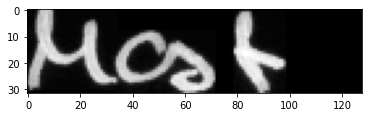



original_text =   sentiment
predicted text = sentiment

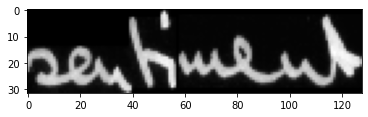



original_text =   would
predicted text = would

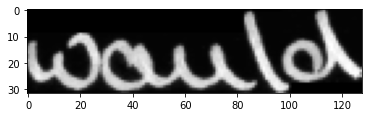



original_text =   still
predicted text = still

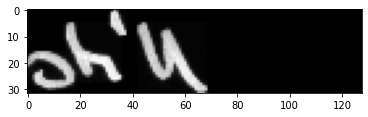



original_text =   favour
predicted text = favour

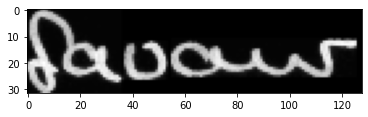



original_text =   the
predicted text = the

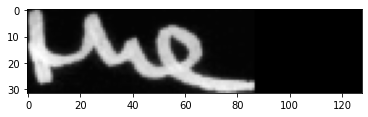



original_text =   abolition
predicted text = abolition

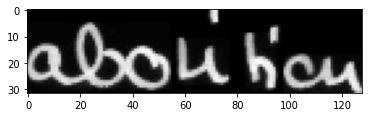



original_text =   of
predicted text = of

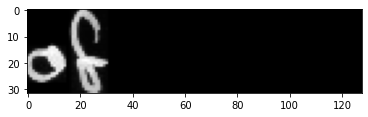



original_text =   the
predicted text = the

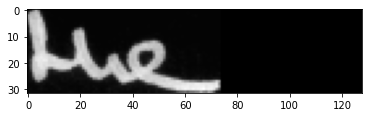



original_text =   House
predicted text = House

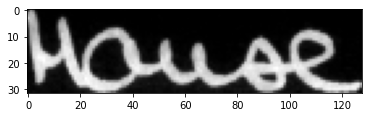



original_text =   Lords
predicted text = Lords

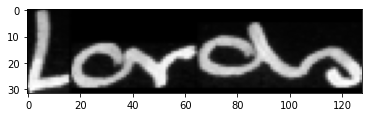



original_text =   ,
predicted text = ,

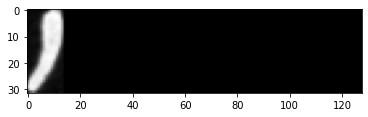



original_text =   but
predicted text = out

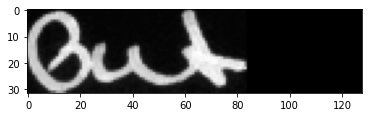



original_text =   while
predicted text = while

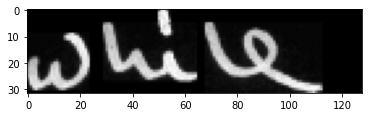



original_text =   it
predicted text = it

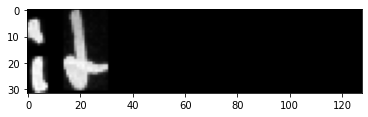



original_text =   remains
predicted text = remains

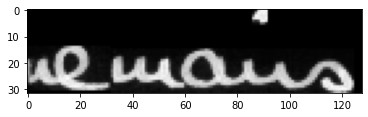



original_text =   Labour
predicted text = Labour

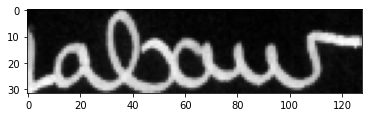



original_text =   has
predicted text = has

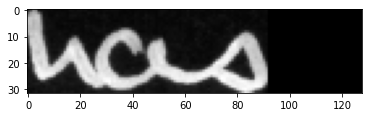



original_text =   to
predicted text = to

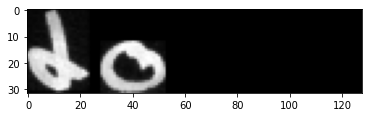



original_text =   an
predicted text = an

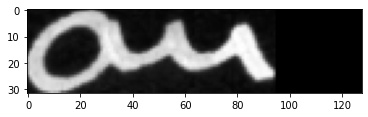



original_text =   adequate
predicted text = adequate

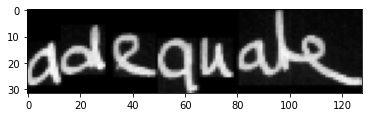



original_text =   number
predicted text = mumber

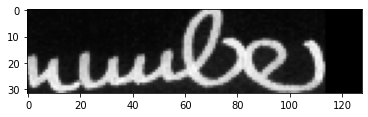



original_text =   of
predicted text = of

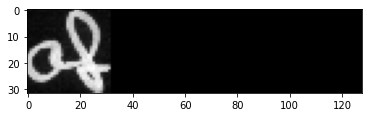



original_text =   members
predicted text = members

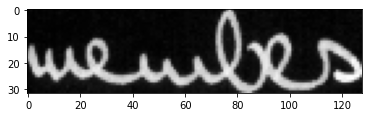



original_text =   .
predicted text = .

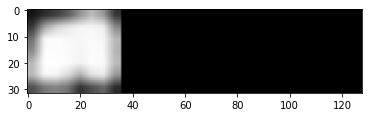



original_text =   THE
predicted text = TME

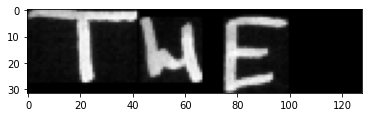



original_text =   two
predicted text = two

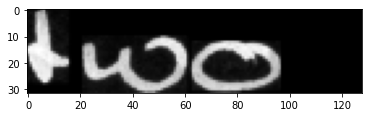



original_text =   rival
predicted text = rival

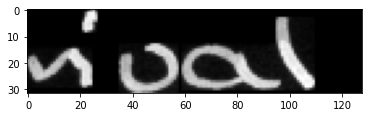



original_text =   Nationalist
predicted text = Nationalist

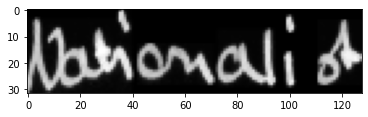



original_text =   Parties
predicted text = Parties

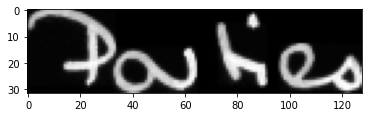



original_text =   of
predicted text = of

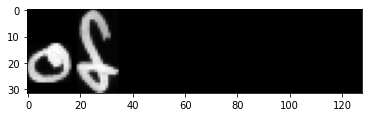



original_text =   Northern
predicted text = Northern

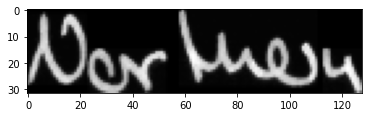



original_text =   Rhodesia
predicted text = Rhodesia

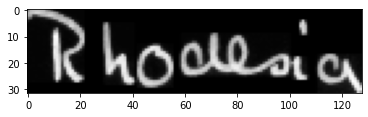



original_text =   have
predicted text = hove

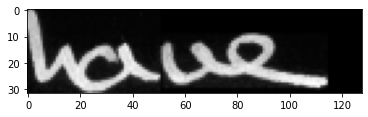



original_text =   agreed
predicted text = agreed

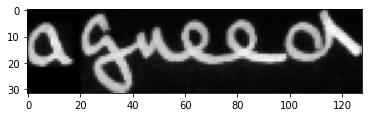



original_text =   to
predicted text = to

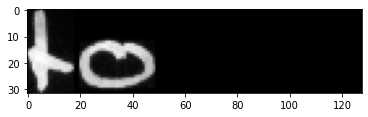



original_text =   get
predicted text = get

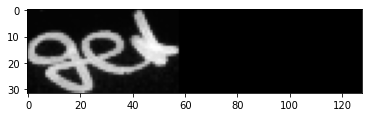



original_text =   to
predicted text = to

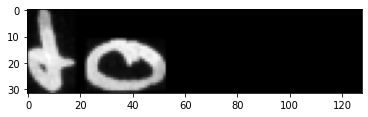



original_text =   face
predicted text = face

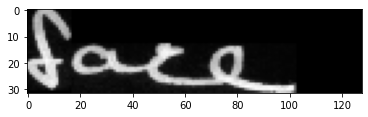



original_text =   the
predicted text = the

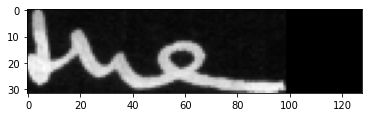



original_text =   challenge
predicted text = challenge

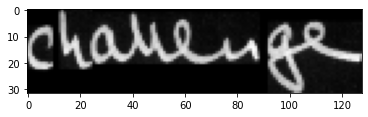



original_text =   from
predicted text = from

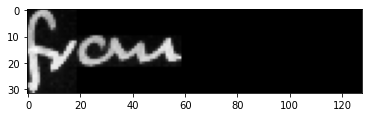



original_text =   Sir
predicted text = Sir

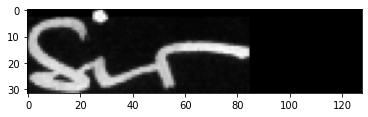



original_text =   Roy
predicted text = Roy

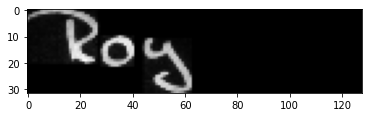



original_text =   Welensky
predicted text = Welensky

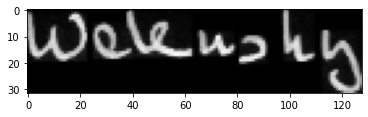



original_text =   ,
predicted text = ,

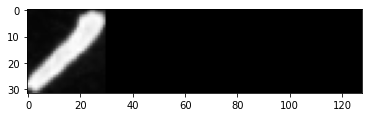



original_text =   Federal
predicted text = Federal

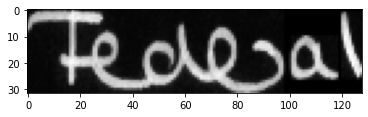



original_text =   Premier
predicted text = Premier

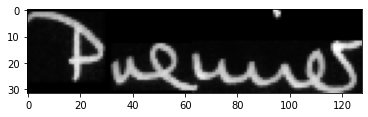



original_text =   .
predicted text = .

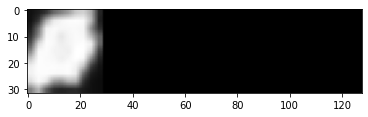



original_text =   Since
predicted text = Since

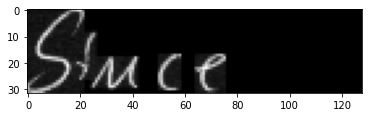



original_text =   1958
predicted text = 1958

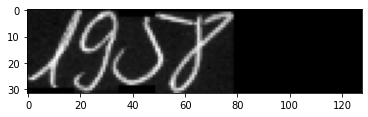



original_text =   ,
predicted text = ,

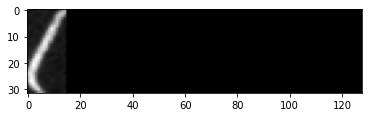



original_text =   13
predicted text = 13

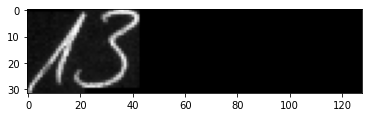



original_text =   Labour
predicted text = Labour

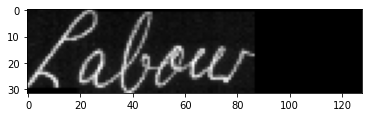



original_text =   life
predicted text = life

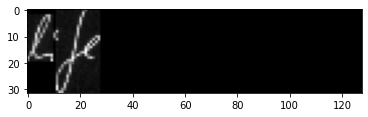



original_text =   and
predicted text = and

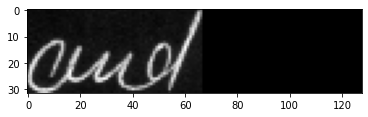



original_text =   #
predicted text = Ps

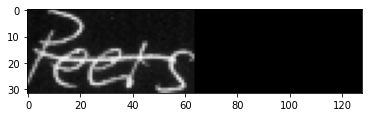



original_text =   Peeresses
predicted text = Peeresses

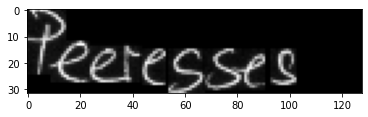



original_text =   have
predicted text = have

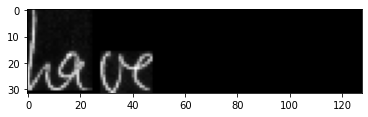



original_text =   been
predicted text = been

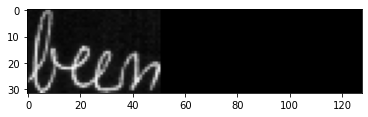



original_text =   created
predicted text = created

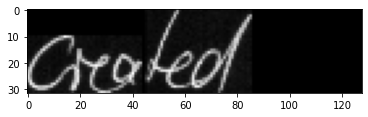



original_text =   .
predicted text = .

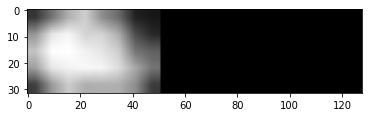



original_text =   Most
predicted text = Mast

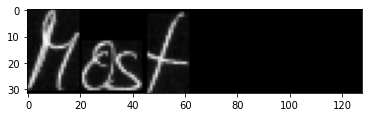



original_text =   Labour
predicted text = Labour

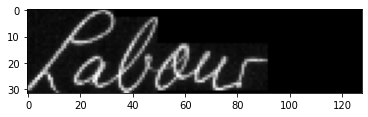



original_text =   would
predicted text = would

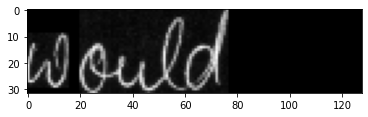



original_text =   still
predicted text = still

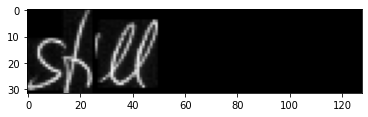



original_text =   favour
predicted text = favss

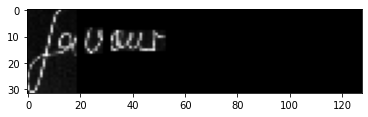



original_text =   the
predicted text = the

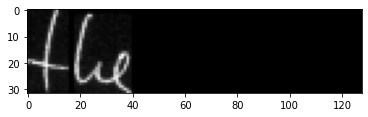



original_text =   abolition
predicted text = abolition

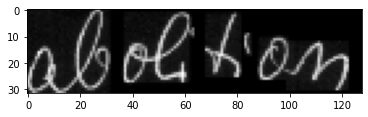



original_text =   of
predicted text = of

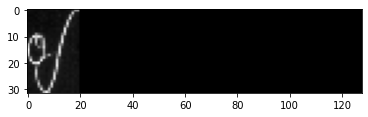



original_text =   the
predicted text = the

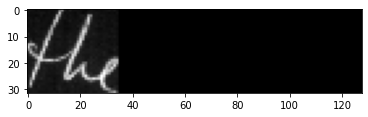



original_text =   House
predicted text = Hause

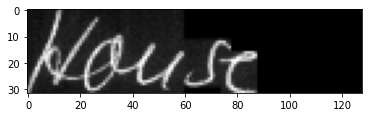



original_text =   of
predicted text = of

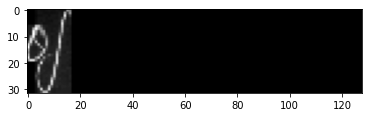



original_text =   ,
predicted text = ,

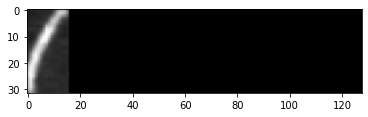



original_text =   but
predicted text = but

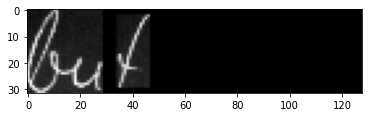



original_text =   while
predicted text = while

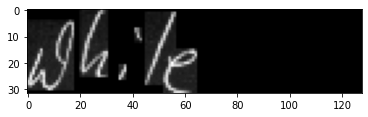



original_text =   it
predicted text = it

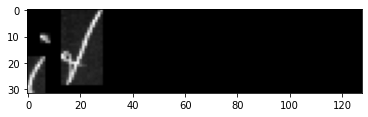



original_text =   remains
predicted text = remains

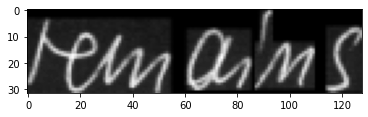



original_text =   Labour
predicted text = Labour

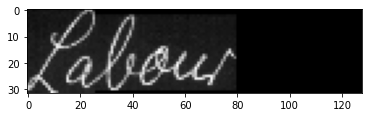



original_text =   has
predicted text = has

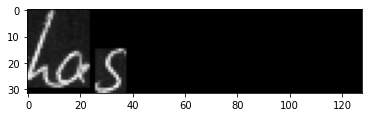



original_text =   to
predicted text = to

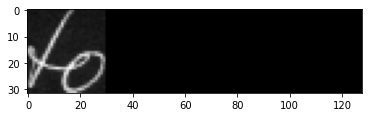



original_text =   have
predicted text = have

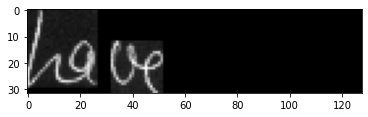



original_text =   adequate
predicted text = adequate

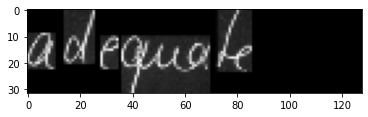



original_text =   number
predicted text = number

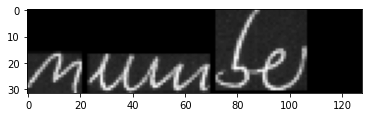



original_text =   of
predicted text = of

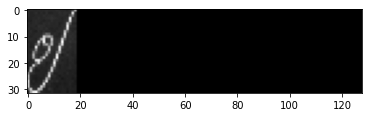



original_text =   members
predicted text = members

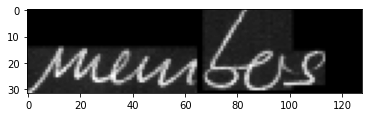



original_text =   .
predicted text = .

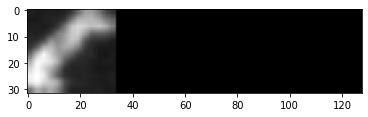



original_text =   THE
predicted text = THE

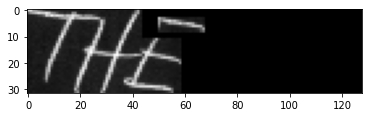



original_text =   two
predicted text = two

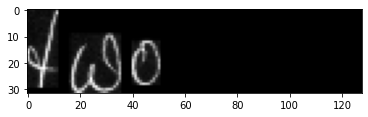



original_text =   rival
predicted text = rival

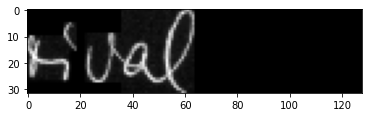



original_text =   African
predicted text = African

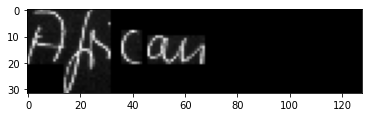



original_text =   Parties
predicted text = Partis

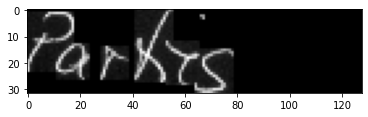



original_text =   of
predicted text = of

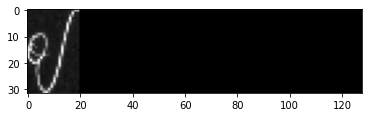



original_text =   Northern
predicted text = Nothern

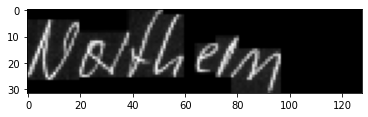



original_text =   Rhodesia
predicted text = Rhodesia

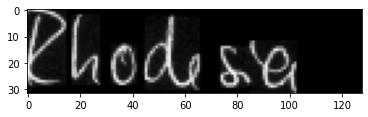



original_text =   have
predicted text = have

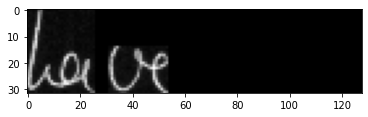



original_text =   agreed
predicted text = agreed

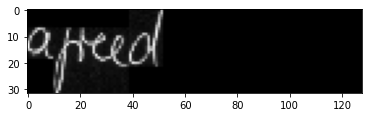



original_text =   to
predicted text = to

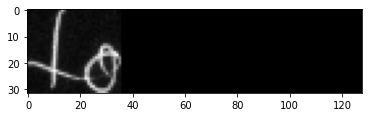



original_text =   get
predicted text = get

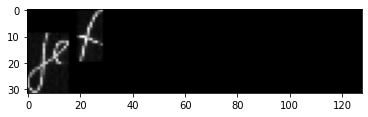



original_text =   together
predicted text = tagether

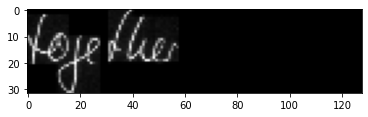



original_text =   face
predicted text = face

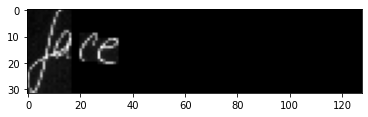



original_text =   the
predicted text = the

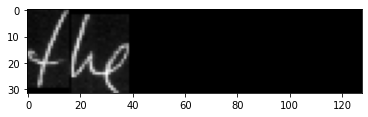



original_text =   challenge
predicted text = challenge

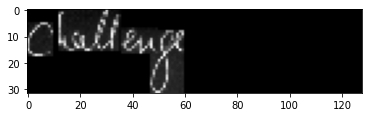



original_text =   from
predicted text = from

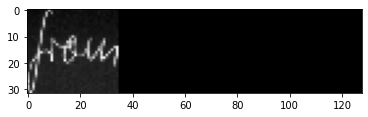



original_text =   Sir
predicted text = Sir

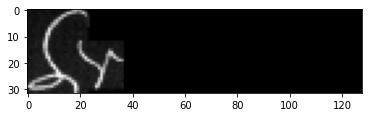



original_text =   Roy
predicted text = Roy

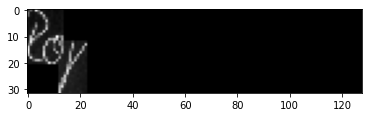



original_text =   Welensky
predicted text = Wehensky

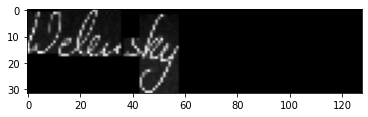



original_text =   ,
predicted text = ,

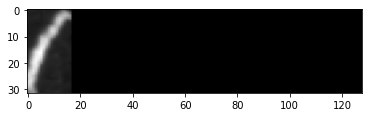



original_text =   the
predicted text = the

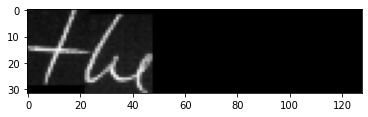



original_text =   Premier
predicted text = Premien

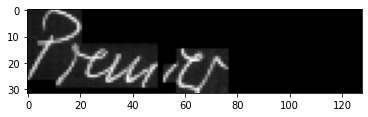



original_text =   .
predicted text = .

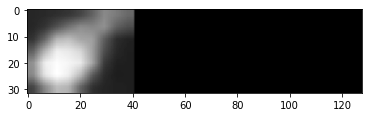



original_text =   Delegates
predicted text = Welegatos

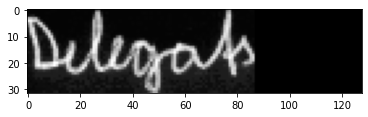



original_text =   from
predicted text = fromn

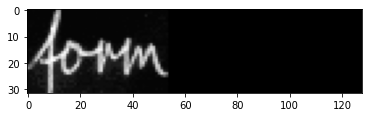



original_text =   Mr.
predicted text = Mr.

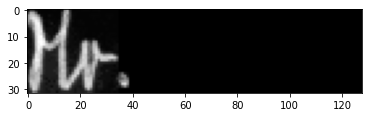



original_text =   Kenneth
predicted text = Kenneth

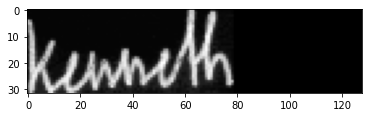



original_text =   Kaunda's
predicted text = Kaunda's

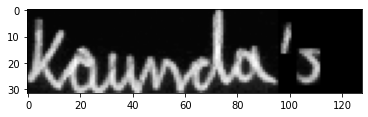



original_text =   United
predicted text = United

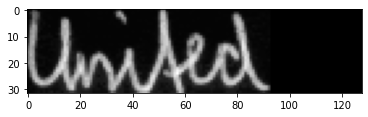



original_text =   National
predicted text = National

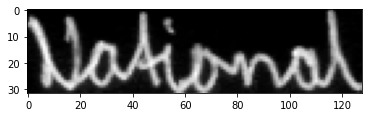



original_text =   National
predicted text = National

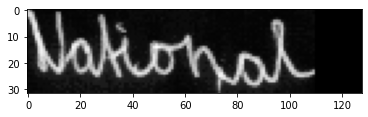



original_text =   Congress
predicted text = Congress

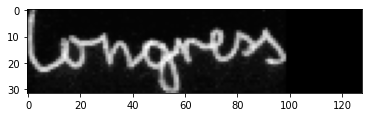



original_text =   (
predicted text = .

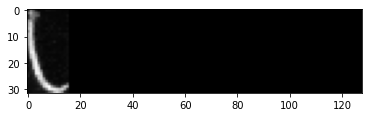



original_text =   400,000
predicted text = noovo0

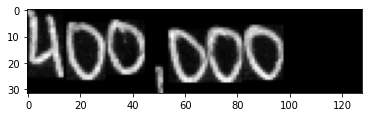



original_text =   )
predicted text = "

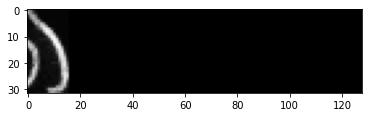



original_text =   will
predicted text = will

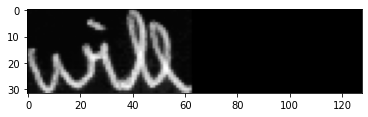



original_text =   meet
predicted text = meet

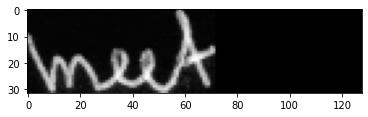



original_text =   in
predicted text = in

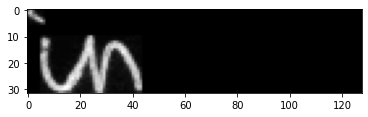



original_text =   London
predicted text = London

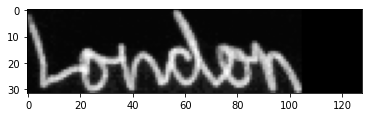



original_text =   to
predicted text = to

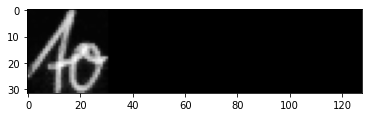



original_text =   discuss
predicted text = discuss

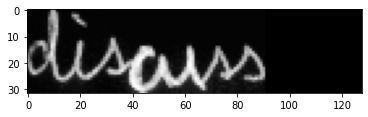



original_text =   a
predicted text = a

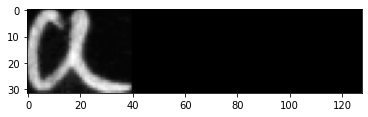



original_text =   common
predicted text = comon

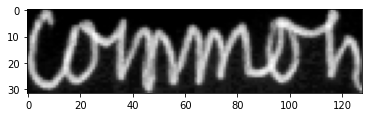



original_text =   course
predicted text = couse

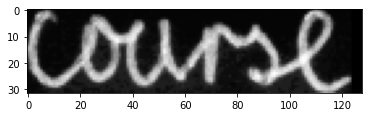



original_text =   of
predicted text = of

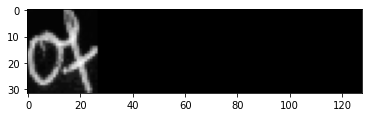



original_text =   action
predicted text = action

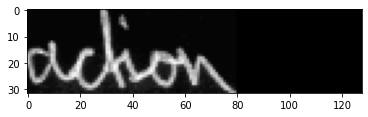



original_text =   .
predicted text = .

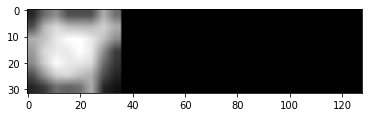



original_text =   Sir
predicted text = Sir

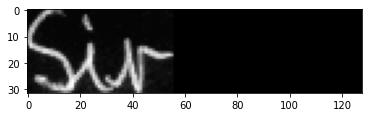



original_text =   is
predicted text = is

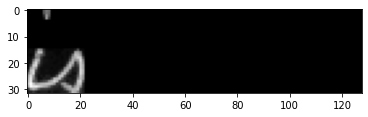



original_text =   violently
predicted text = violently

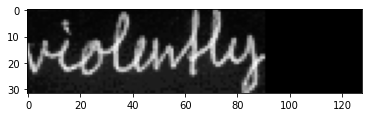



original_text =   opposed
predicted text = opposed

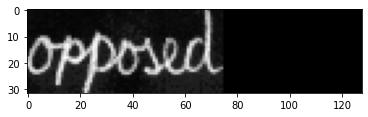



original_text =   to
predicted text = to

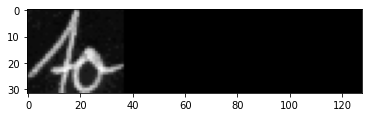



original_text =   Africans
predicted text = Africans

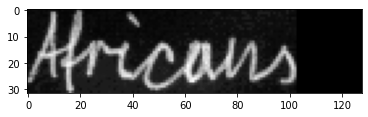



original_text =   getting
predicted text = getting

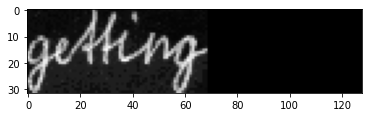



original_text =   an
predicted text = an

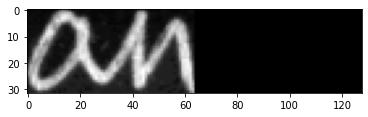



original_text =   elected
predicted text = elected

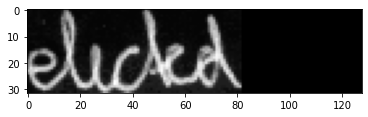



original_text =   majority
predicted text = majority

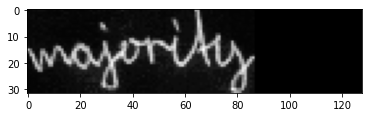



original_text =   Northern
predicted text = Northen

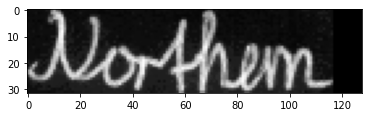



original_text =   Rhodesia
predicted text = Rhodesia

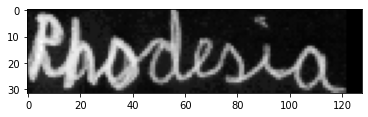



original_text =   ,
predicted text = ,

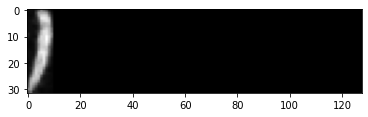



original_text =   but
predicted text = but

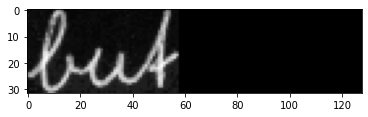



original_text =   the
predicted text = the

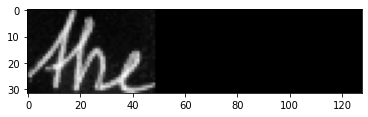



original_text =   Colonial
predicted text = Colonial

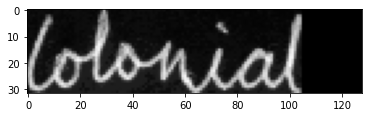



original_text =   Secretary
predicted text = Secnetany

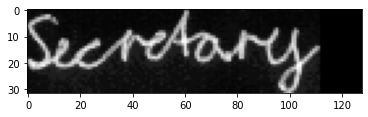



original_text =   ,
predicted text = ,

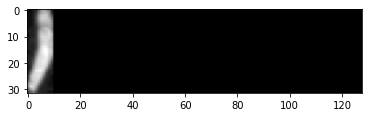



original_text =   Mr.
predicted text = Mr.

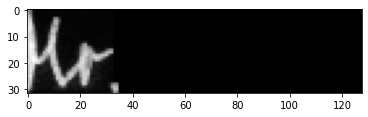



original_text =   Macleod
predicted text = Macleod

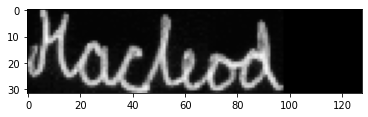



original_text =   ,
predicted text = ,

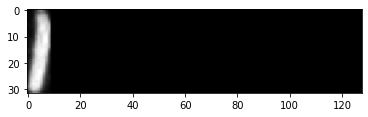



original_text =   is
predicted text = is

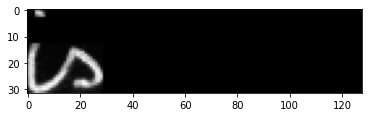



original_text =   insisting
predicted text = insisting

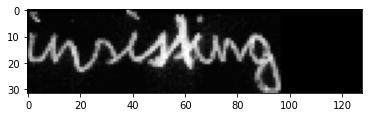



original_text =   on
predicted text = on

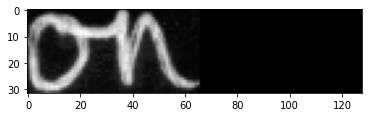



original_text =   a
predicted text = a

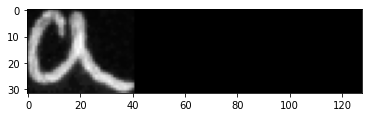



original_text =   policy
predicted text = poticy

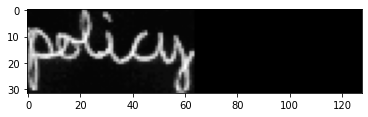



original_text =   of
predicted text = of

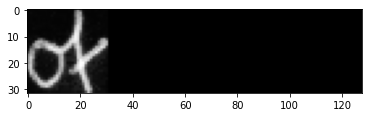



original_text =   change
predicted text = change

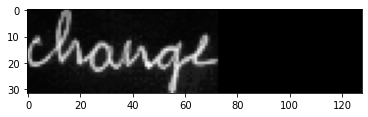



original_text =   Delegates
predicted text = Belegates

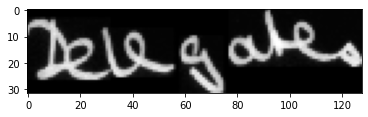



original_text =   from
predicted text = from

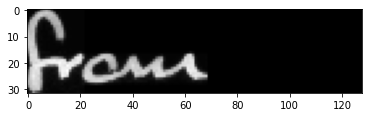



original_text =   Mr.
predicted text = Mr.

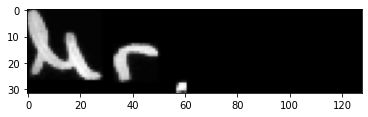



original_text =   Kenneth
predicted text = Kenneth

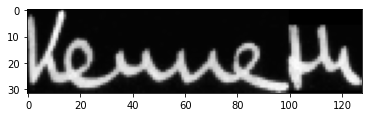



original_text =   Kaunda's
predicted text = Kaunda's

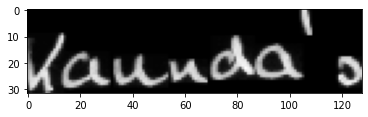



original_text =   United
predicted text = United

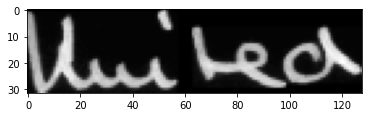



original_text =   National
predicted text = National

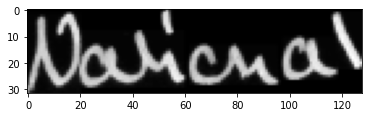



original_text =   Independence
predicted text = ndependence

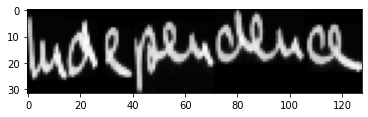



original_text =   Party
predicted text = Party

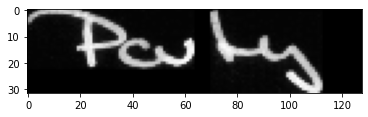



original_text =   280,000
predicted text = 250,000

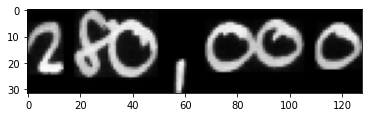



original_text =   members
predicted text = members

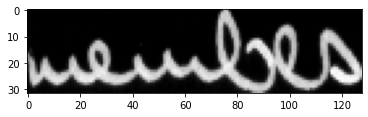



original_text =   )
predicted text = ,

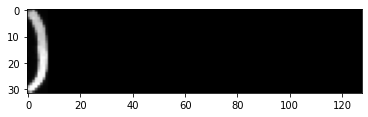



original_text =   and
predicted text = and

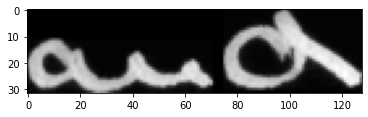



original_text =   Mr.
predicted text = Mr.

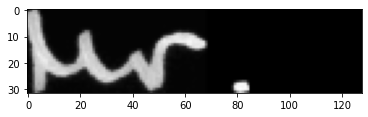



original_text =   Harry
predicted text = Harry

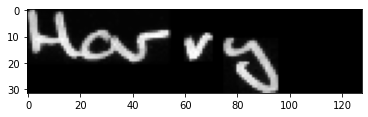



original_text =   Nkumbula's
predicted text = Numbula's

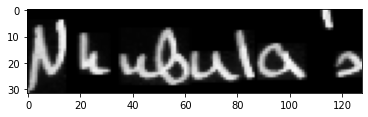



original_text =   African
predicted text = African

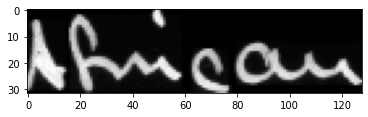



original_text =   National
predicted text = National

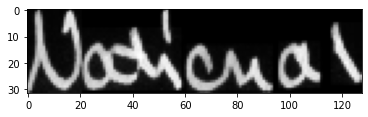



original_text =   (
predicted text = ,

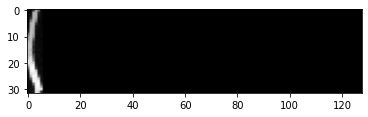



original_text =   400,000
predicted text = 400,00o

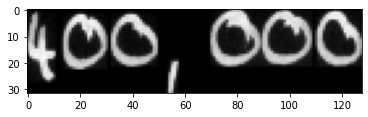



original_text =   )
predicted text = ,

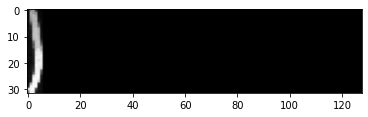



original_text =   will
predicted text = will

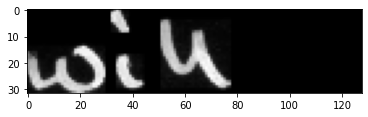



original_text =   meet
predicted text = meet

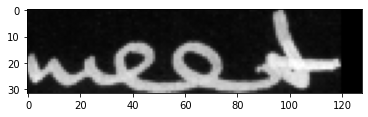



original_text =   in
predicted text = in

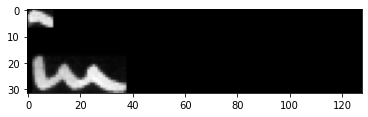



original_text =   London
predicted text = London

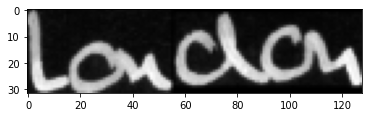



original_text =   today
predicted text = today

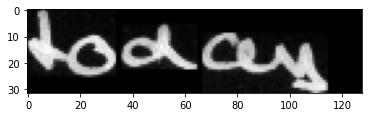



original_text =   to
predicted text = to

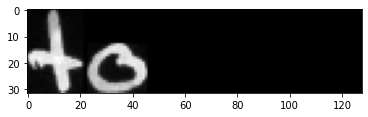



original_text =   a
predicted text = a

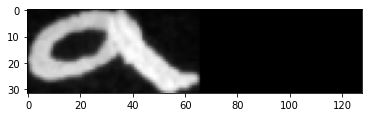



original_text =   common
predicted text = commnon

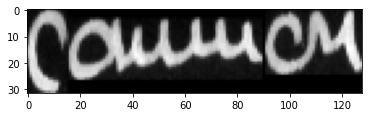



original_text =   course
predicted text = course

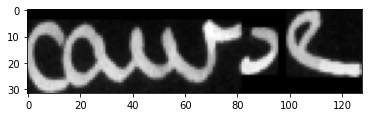



original_text =   of
predicted text = of

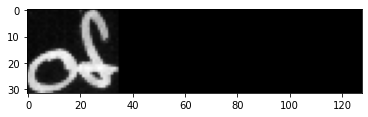



original_text =   action
predicted text = action

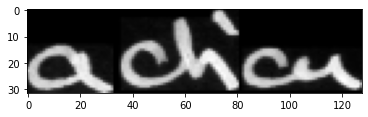



original_text =   .
predicted text = .

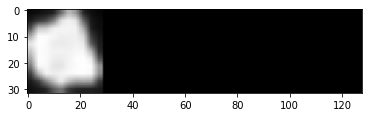



original_text =   Sir
predicted text = Sir

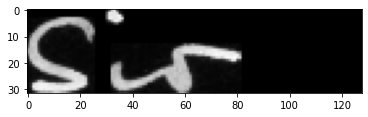



original_text =   Roy
predicted text = Roy

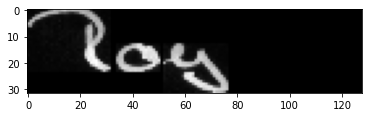



original_text =   is
predicted text = is

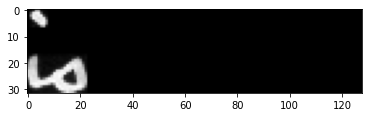



original_text =   opposed
predicted text = opposed

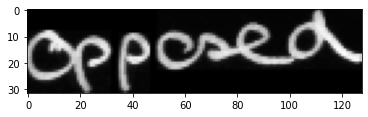



original_text =   to
predicted text = to

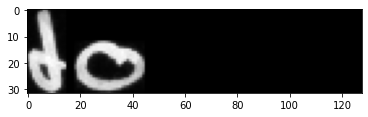



original_text =   Africans
predicted text = Africanns

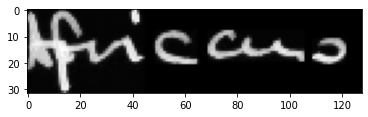



original_text =   getting
predicted text = getting

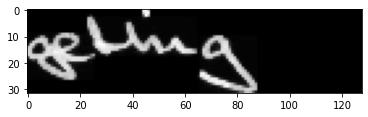



original_text =   an
predicted text = and

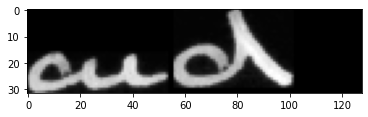



original_text =   elected
predicted text = elected

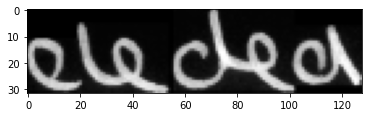



original_text =   majority
predicted text = majonrity

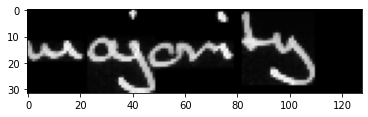



original_text =   in
predicted text = in

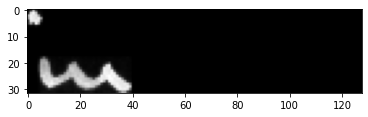



original_text =   Northern
predicted text = Northern

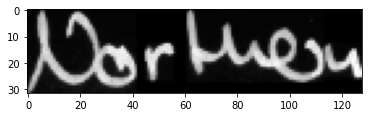



original_text =   ,
predicted text = ,

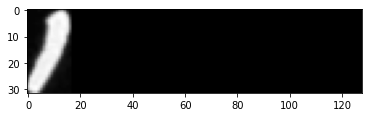



original_text =   but
predicted text = out

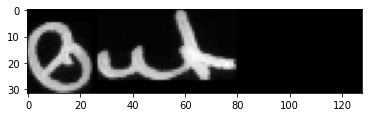



original_text =   the
predicted text = the

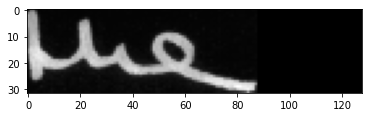



original_text =   Colonial
predicted text = Colonial

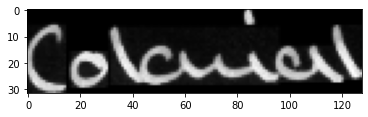



original_text =   Secretary
predicted text = Secretary

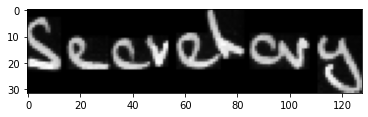



original_text =   ,
predicted text = ,

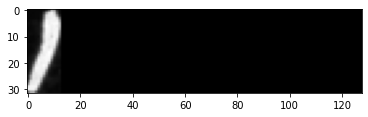



original_text =   Mr.
predicted text = Mr.

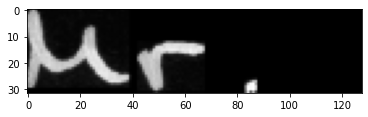



original_text =   Iain
predicted text = lain

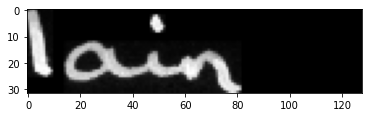



original_text =   Macleod
predicted text = Macleod

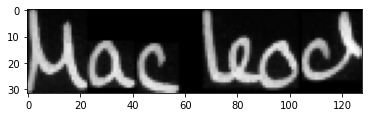



original_text =   is
predicted text = is

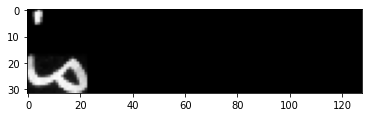



original_text =   insisting
predicted text = insisting

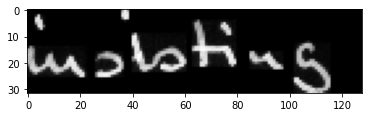



original_text =   on
predicted text = on

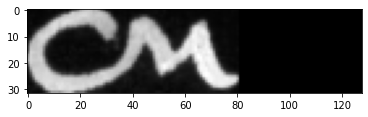



original_text =   a
predicted text = a

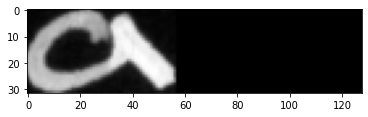



original_text =   policy
predicted text = policy

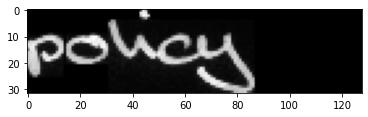



original_text =   of
predicted text = of

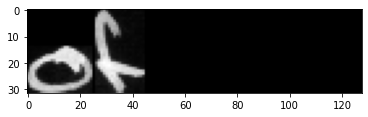



original_text =   change
predicted text = change

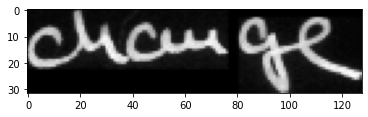



original_text =   .
predicted text = .

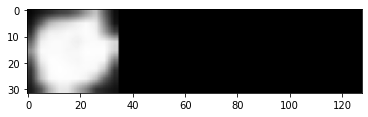



original_text =   Macleod
predicted text = Maclead

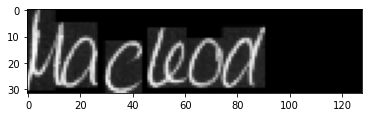



original_text =   ,
predicted text = ,

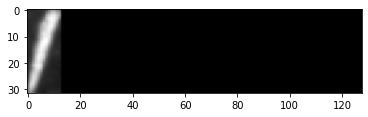



original_text =   is
predicted text = in

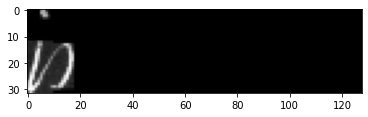



original_text =   on
predicted text = on

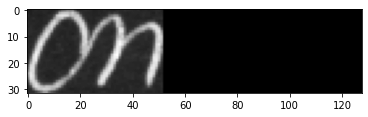



original_text =   a
predicted text = a

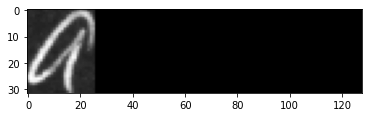



original_text =   policy
predicted text = policy

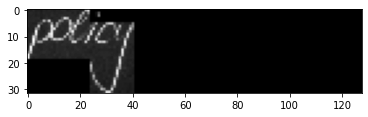



original_text =   of
predicted text = of

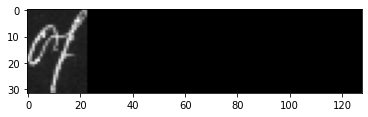



original_text =   change
predicted text = change

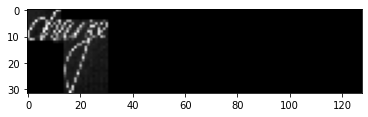



original_text =   .
predicted text = .

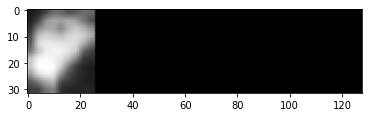



original_text =   Sir
predicted text = Sir

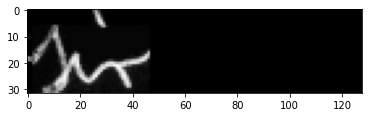



original_text =   Roy's
predicted text = Roy's

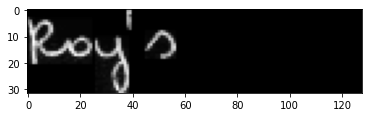



original_text =   United
predicted text = United

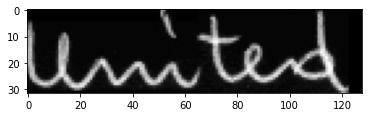



original_text =   Party
predicted text = Panty

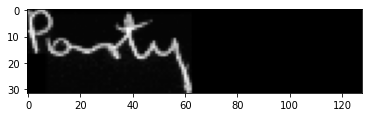



original_text =   is
predicted text = is

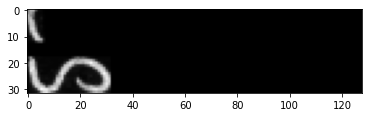



original_text =   boycotting
predicted text = boycotting

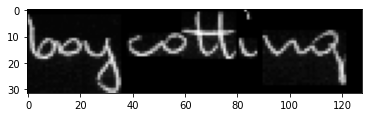



original_text =   the
predicted text = the

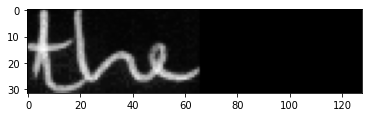



original_text =   London
predicted text = London

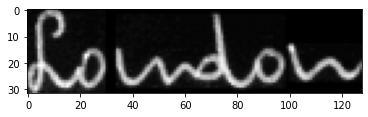



original_text =   talks
predicted text = takks

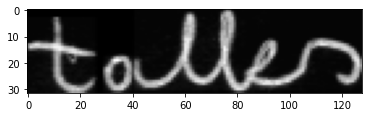



original_text =   on
predicted text = on

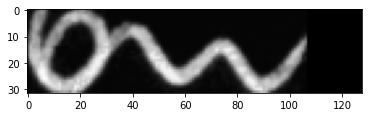



original_text =   the
predicted text = the

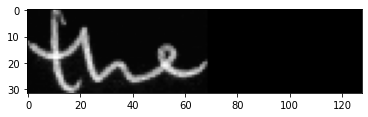



original_text =   Protectorate's
predicted text = Protectorate's

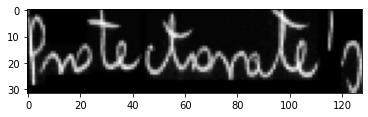



original_text =   .
predicted text = .

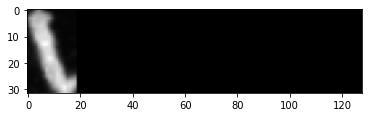



original_text =   Said
predicted text = hid

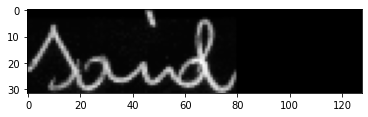



original_text =   Mr.
predicted text = Mr.

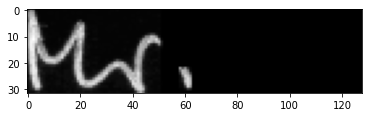



original_text =   Nkumbula
predicted text = NKumbula

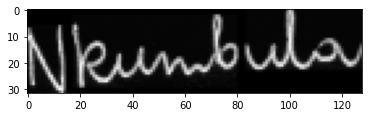



original_text =   last
predicted text = last

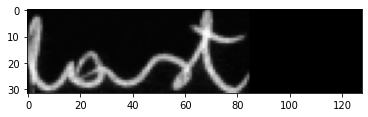



original_text =   night
predicted text = night

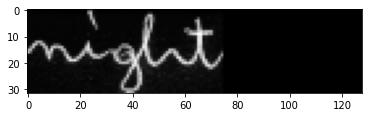



original_text =   :
predicted text = :

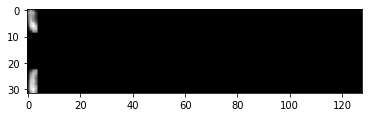



original_text =   "
predicted text = "

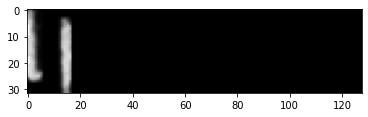



original_text =   We
predicted text = we

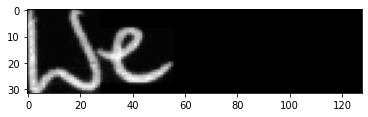



original_text =   to
predicted text = to

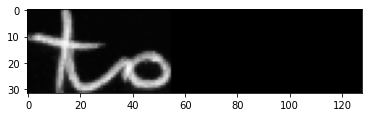



original_text =   discuss
predicted text = disuus

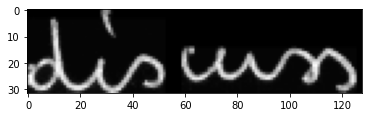



original_text =   what
predicted text = what

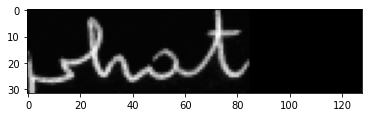



original_text =   to
predicted text = to

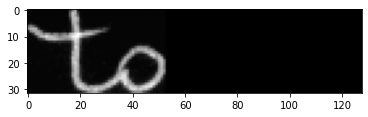



original_text =   do
predicted text = do

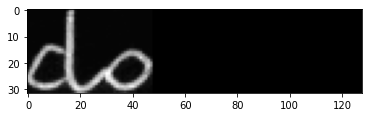



original_text =   if
predicted text = if

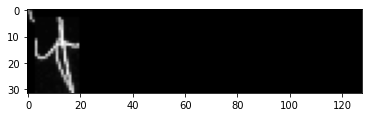



original_text =   the
predicted text = the

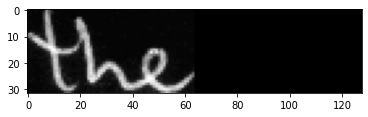



original_text =   British
predicted text = British

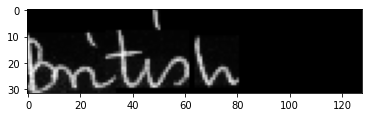



original_text =   Government
predicted text = Governnmennt

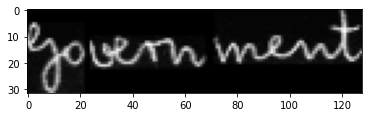



original_text =   in
predicted text = in

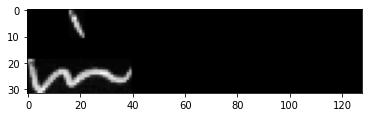



original_text =   to
predicted text = to

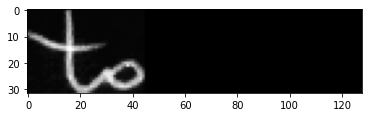



original_text =   Sir
predicted text = Si

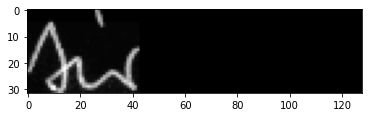



original_text =   Roy
predicted text = Roy

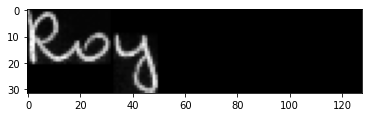



original_text =   and
predicted text = and

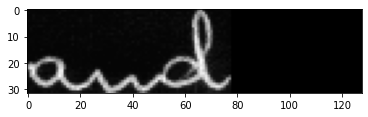



original_text =   the
predicted text = the

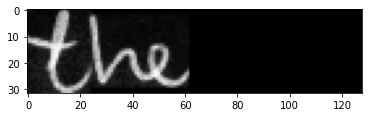



original_text =   talks
predicted text = talks

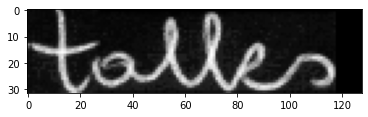



original_text =   fall
predicted text = fall

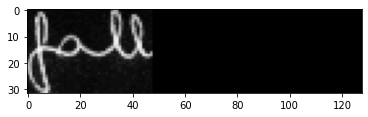



original_text =   through
predicted text = though

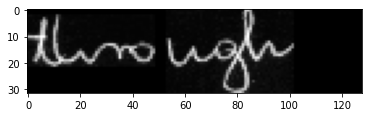



original_text =   There
predicted text = there

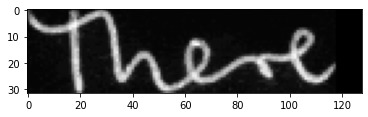



original_text =   are
predicted text = are

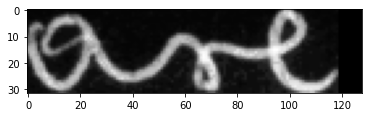



original_text =   bound
predicted text = bound

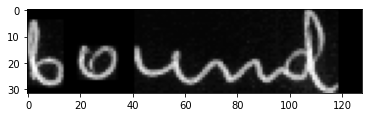



original_text =   chief
predicted text = chief

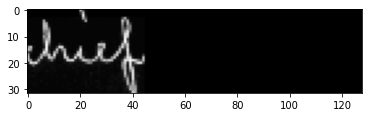



original_text =   aide
predicted text = nide

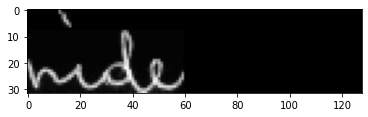



original_text =   ,
predicted text = ,

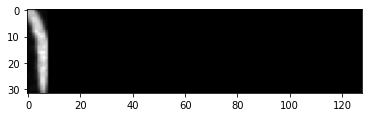



original_text =   Mr.
predicted text = Mr.

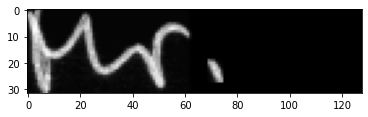



original_text =   Julius
predicted text = Julins

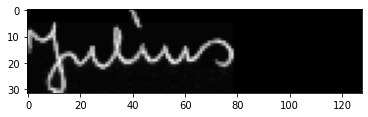



original_text =   Greenfield
predicted text = Greenfield

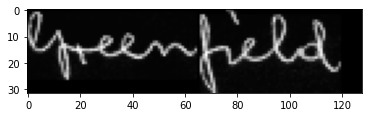



original_text =   ,
predicted text = ,

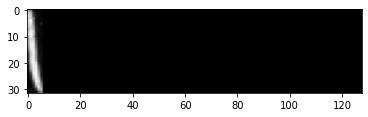



original_text =   telephoned
predicted text = telephoned

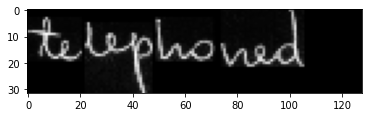



original_text =   chief
predicted text = chief

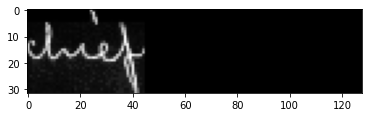



original_text =   a
predicted text = a

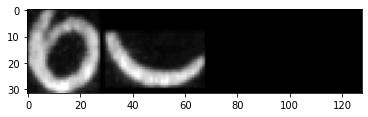



original_text =   report
predicted text = report

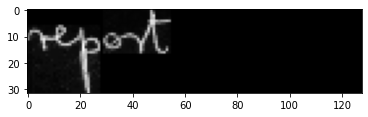



original_text =   on
predicted text = on

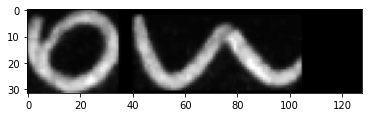



original_text =   his
predicted text = his

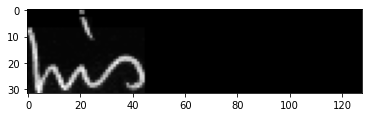



original_text =   talks
predicted text = talks

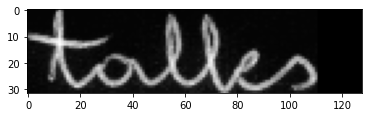



original_text =   with
predicted text = with

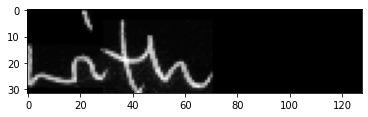



original_text =   Mr.
predicted text = Mr.

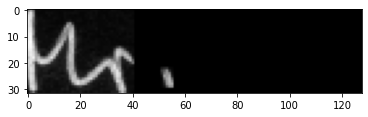



original_text =   Macmillan
predicted text = Macmillan

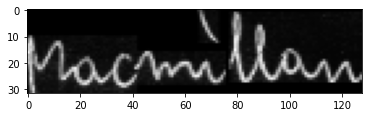



original_text =   Chequers
predicted text = Chequerns

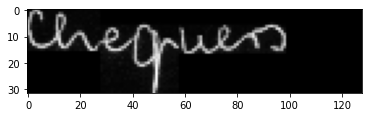



original_text =   .
predicted text = .

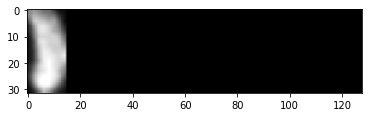



original_text =   Sir
predicted text = Sir

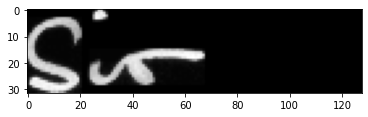



original_text =   Roy's
predicted text = Toy's

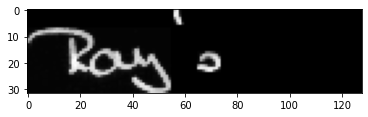



original_text =   United
predicted text = United

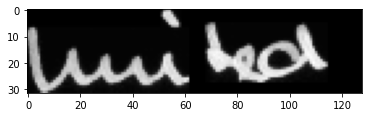



original_text =   Federal
predicted text = Federal

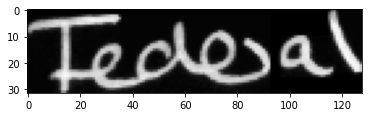



original_text =   Party
predicted text = Party

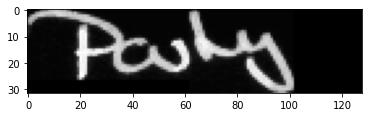



original_text =   is
predicted text = is

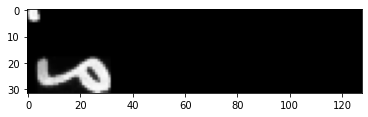



original_text =   boycotting
predicted text = baycatting

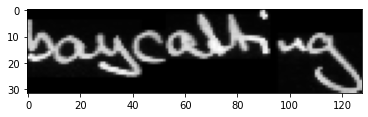



original_text =   London
predicted text = London

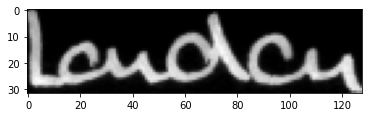



original_text =   talks
predicted text = talks

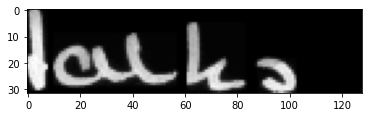



original_text =   on
predicted text = on

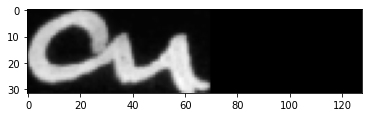



original_text =   the
predicted text = the

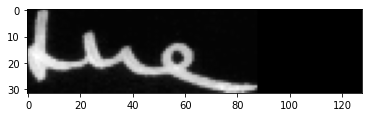



original_text =   last
predicted text = last

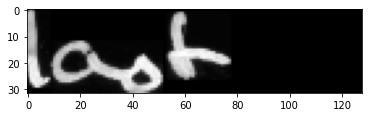



original_text =   night
predicted text = night

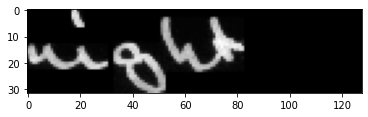



original_text =   :
predicted text = :

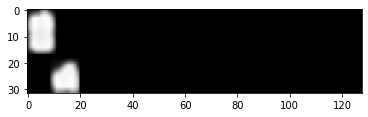



original_text =   "
predicted text = "

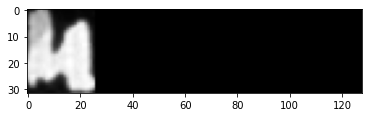



original_text =   We
predicted text = We

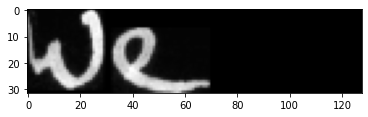



original_text =   want
predicted text = want

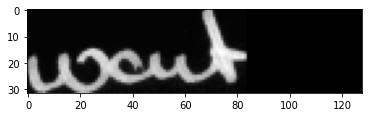



original_text =   to
predicted text = to

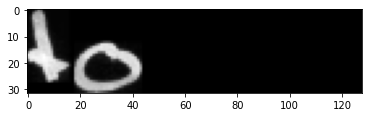

In [41]:
prediction = act_model.predict(train_images[50:645])
 
# use CTC decoder
decoded = K.ctc_decode(prediction,   
                       input_length=np.ones(prediction.shape[0]) * prediction.shape[1],
                       greedy=True)[0][0]

out = K.get_value(decoded)

# see the results
for i, x in enumerate(out):
    print("original_text =  ", train_original_text[50+i])
    print("predicted text = ", end = '')
    for p in x:
        if int(p) != -1:
            print(char_list[int(p)], end = '')
    plt.imshow(train_images[50+i].reshape(32,128), cmap=plt.cm.gray)
    plt.show()
    print('\n')

In [27]:
def plotgraph(epochs, acc, val_acc):
    # Plot training & validation accuracy values
    plt.plot(epochs, acc, 'b')
    plt.plot(epochs, val_acc, 'r')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Val'], loc='upper left')
    plt.show()

In [38]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1,len(loss)+1)

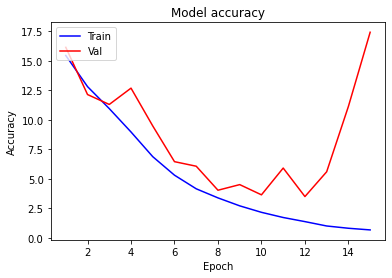

In [39]:
plotgraph(epochs, loss, val_loss)

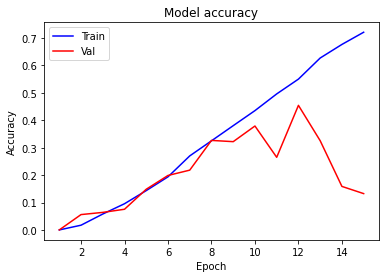

In [40]:
plotgraph(epochs, acc, val_acc)

In [31]:
minimum_val_loss = np.min(history.history['val_loss'])
best_model_index = np.where(history.history['val_loss'] == minimum_val_loss)[0][0]

best_loss = str(history.history['loss'][best_model_index])
best_acc = str(history.history['accuracy'][best_model_index])
best_val_loss = str(history.history['val_loss'][best_model_index])
best_val_acc = str(history.history['val_accuracy'][best_model_index])

In [32]:
with open('/content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Model/history.txt', 'a') as f:
    new_data = '{},{},{},{},{},{},{},{},{},{}\n'.format(filepath, 
                                                      optimizer_name, 
                                                      str(RECORDS_COUNT), 
                                                      e, 
                                                      str(train_images.shape[0]),
                                                      str(valid_images.shape[0]), 
                                                      best_loss, 
                                                      best_acc, 
                                                      best_val_loss, 
                                                      best_val_acc)
    f.write(new_data)

In [33]:
model.save('/content/gdrive/MyDrive/Colab Notebooks/TcsInternship/HTR_Using_CRNN/Model/Text_recognizer_Using_CRNN.h5')